In [1]:
%run "..\..\Startup_py3.py"
sys.path.append(r"..\..\..\..\Documents")

import ImageAnalysis3 as ia
%matplotlib notebook

from ImageAnalysis3 import *
print(os.getpid())

import h5py
from ImageAnalysis3.classes import _allowed_kwds
import ast

creating new log file
2022-01-03 15:47:32,620 [INFO] WRITING LOG OUTPUT TO C:\Users\puzheng\.cellpose\run.log
34724


In [4]:
import numpy as np
from cellpose import models, utils
import os
import sys
import torch
import cv2
import h5py 
import ast

import pandas as pd
sys.path.append(r"..\..\..\..\Documents")
from ImageAnalysis3.io_tools.crop import generate_neighboring_crop
from skimage.segmentation import random_walker

channel_2_th = {
    '750':1000,
    '647':1500,
}
overwrite=False
#torch.cuda.set_device('cuda:1')

print(os.getpid())

34724


In [5]:
save_folder = r'\\crick\Shiwei_Crick_4\Analyzed_Data\20211216-P_brain_CTP12-RNA'
save_filenames = [os.path.join(save_folder, _fl) for _fl in os.listdir(save_folder)
                  if _fl.split(os.extsep)[-1]=='hdf5']
print(len(save_filenames))
segmentation_folder = os.path.join(save_folder, 'Segmentation')
if not os.path.exists(segmentation_folder):
    os.makedirs(segmentation_folder)
gene_count_folder = os.path.join(save_folder, 'GeneCounts')
if not os.path.exists(gene_count_folder):
    os.makedirs(gene_count_folder)
cell_location_folder = os.path.join(save_folder, 'CellLocations')
if not os.path.exists(cell_location_folder):
    os.makedirs(cell_location_folder)

211


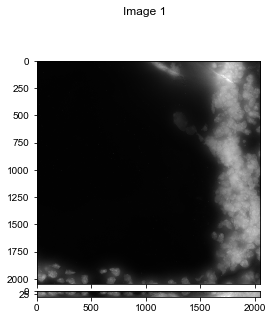

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_000_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_000_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


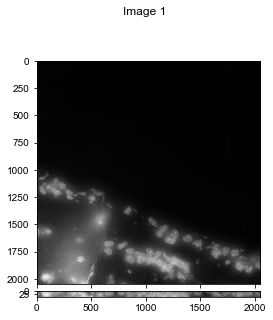

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_001_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_001_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


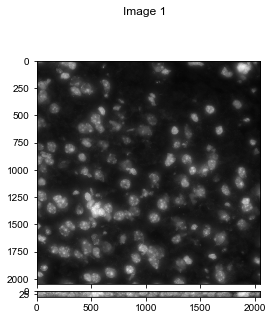

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_002_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_002_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


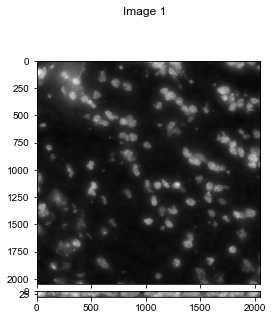

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_003_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_003_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


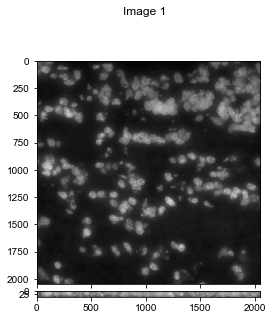

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_004_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_004_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


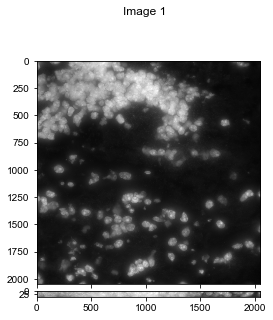

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_005_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_005_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


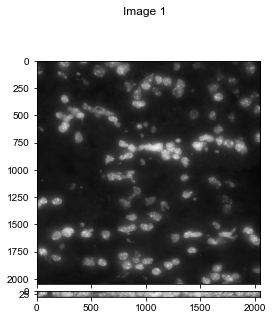

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_006_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_006_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


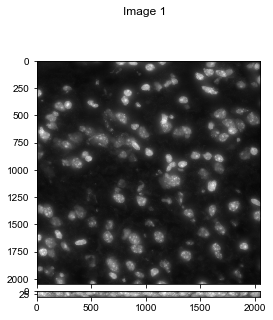

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_007_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_007_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


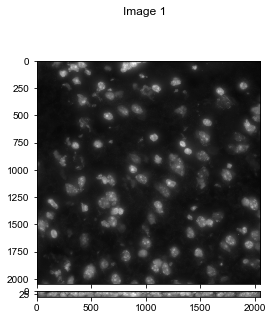

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_008_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_008_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


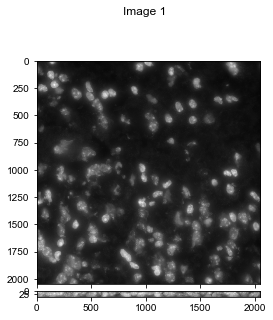

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_009_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_009_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


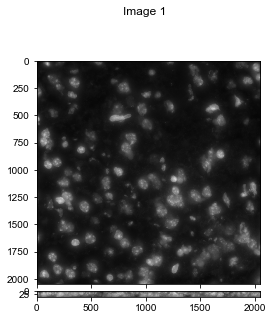

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_010_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_010_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


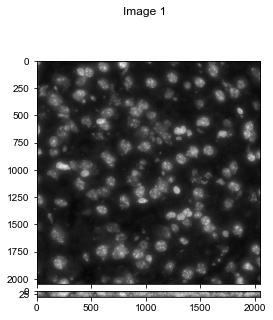

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_011_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_011_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


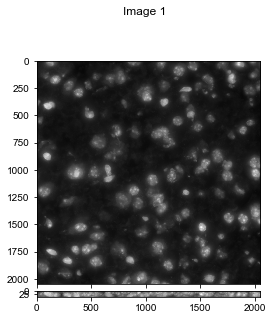

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_012_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_012_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


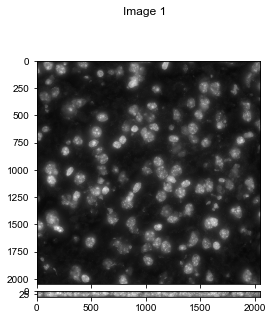

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_013_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_013_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


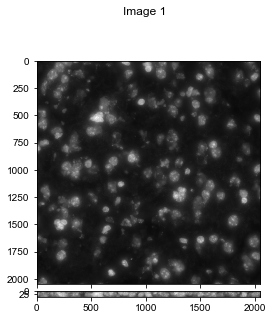

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_014_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_014_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


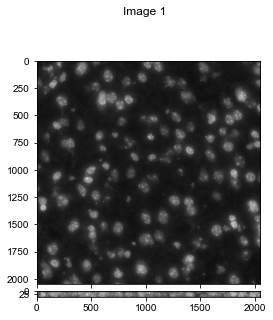

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_015_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_015_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


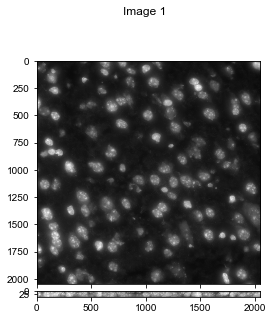

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_016_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_016_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


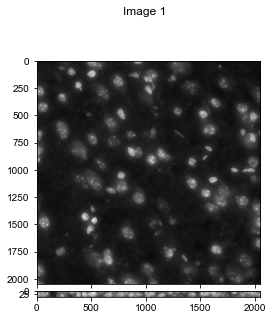

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_017_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_017_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


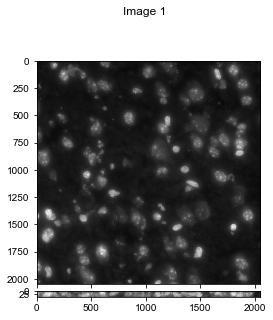

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_018_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_018_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


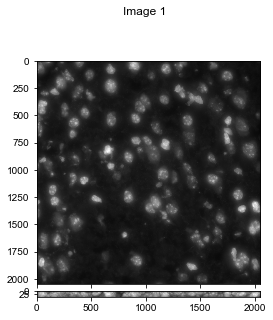

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_019_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_019_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


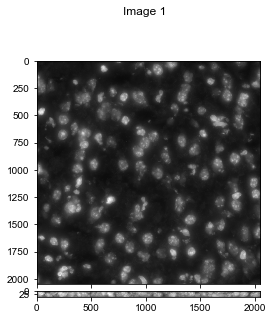

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_020_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_020_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


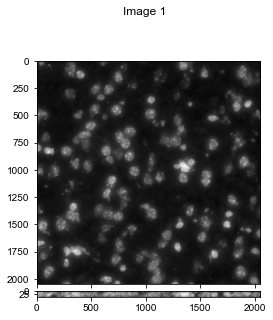

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_021_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_021_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


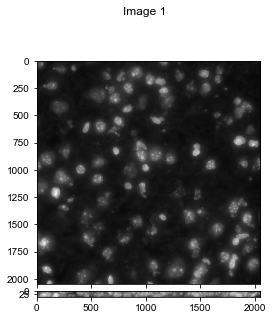

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_022_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_022_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


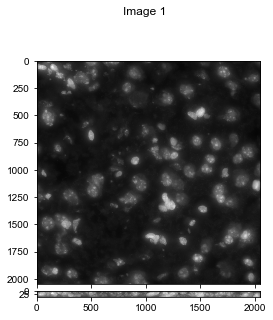

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_023_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_023_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


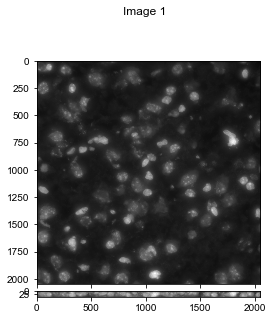

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_024_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_024_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


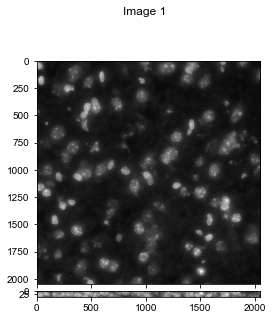

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_025_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_025_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


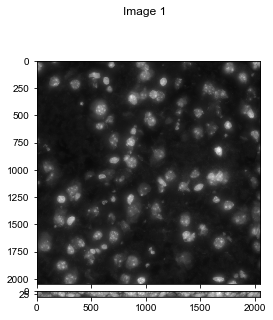

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_026_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_026_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


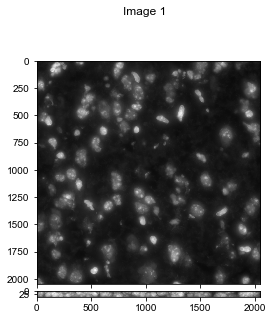

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_027_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_027_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


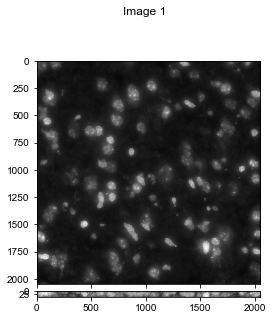

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_028_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_028_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


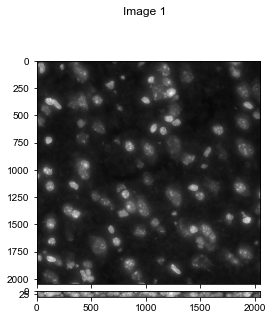

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_029_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_029_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


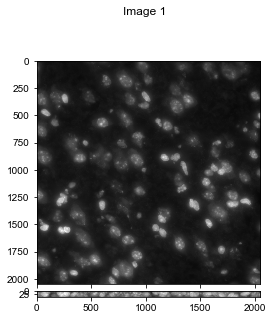

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_030_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_030_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


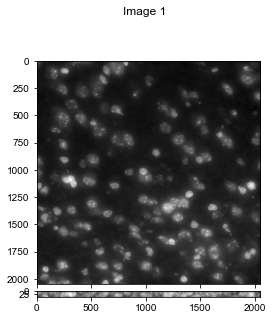

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_031_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_031_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


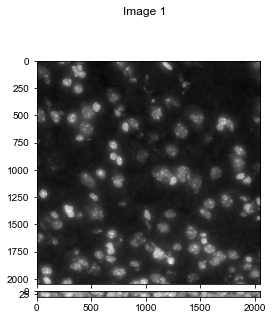

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_032_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_032_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


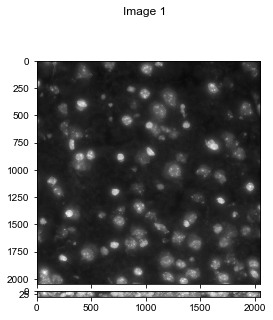

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_033_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_033_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


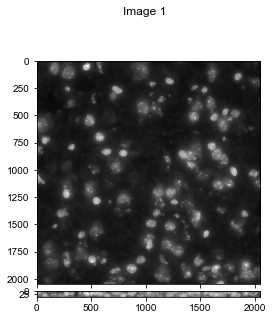

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_034_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_034_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


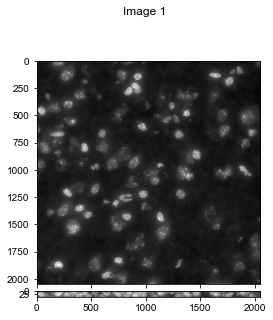

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_035_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_035_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


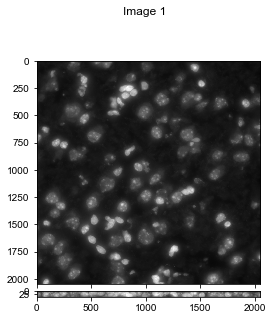

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_036_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_036_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


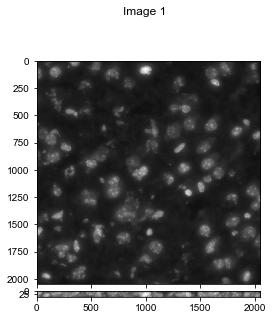

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_037_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_037_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


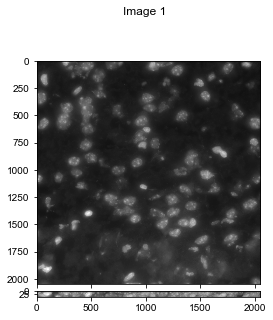

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_038_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_038_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


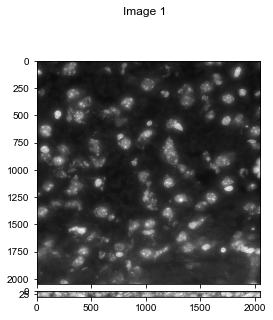

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_039_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_039_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


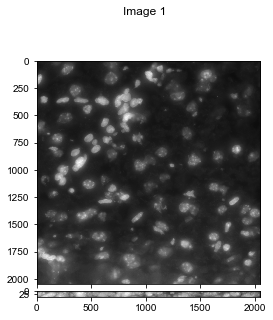

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_040_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_040_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


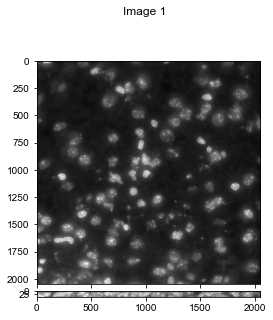

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_041_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_041_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


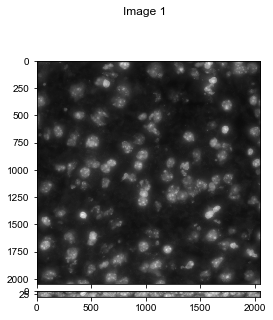

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_042_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_042_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


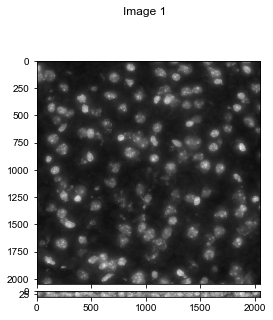

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_043_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_043_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


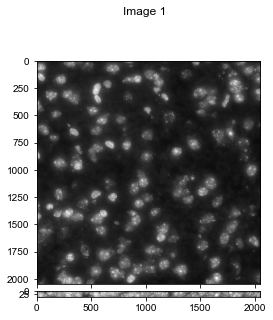

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_044_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_044_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


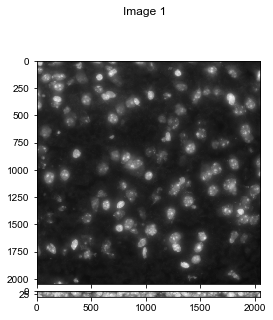

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_045_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_045_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


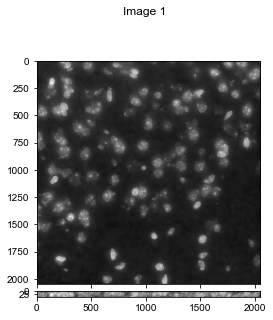

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_046_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_046_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


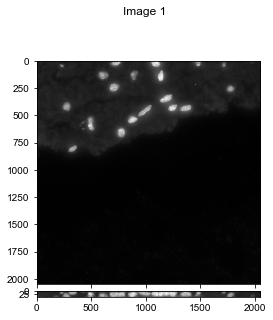

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_047_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_047_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


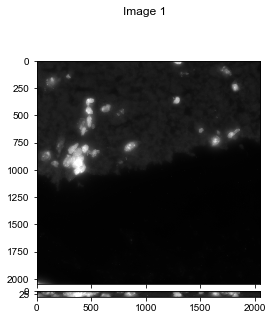

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_048_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_048_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


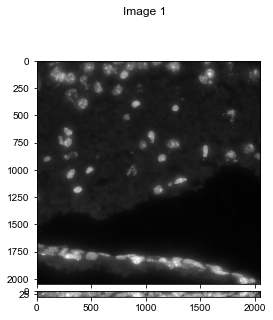

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_049_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_049_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


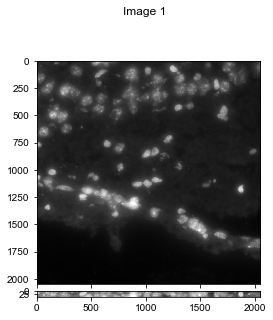

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_050_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_050_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


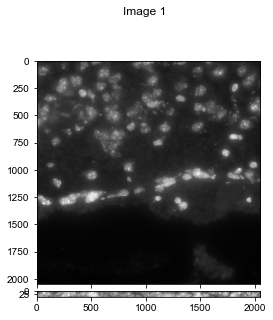

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_051_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_051_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


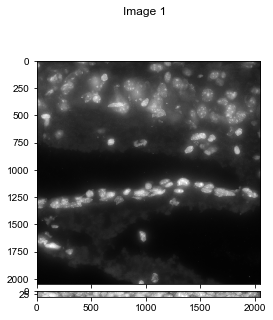

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_052_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_052_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


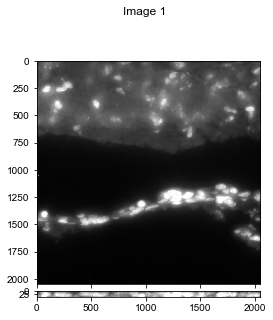

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_053_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_053_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


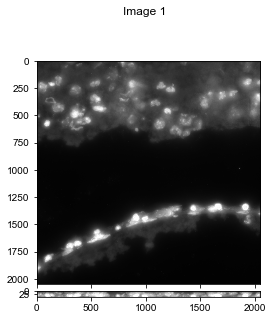

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_054_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_054_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


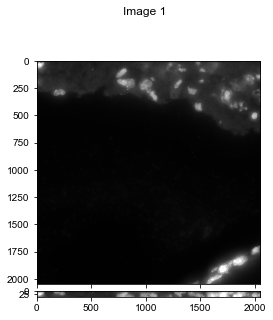

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_055_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_055_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


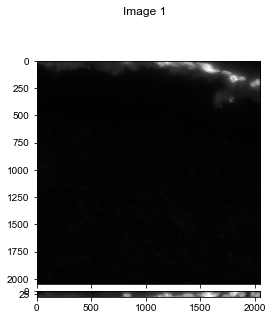

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_056_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_056_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


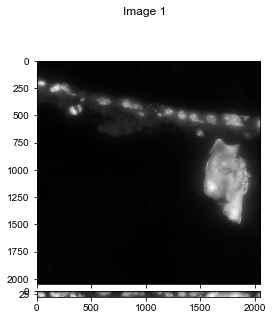

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_057_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_057_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


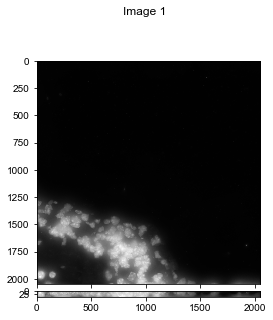

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_058_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_058_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


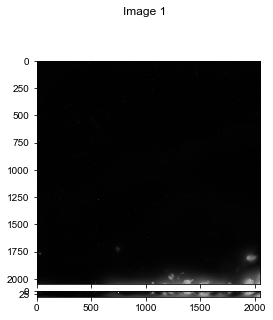

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_059_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_059_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


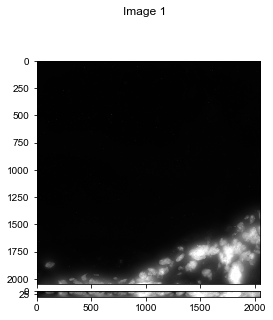

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_060_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_060_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


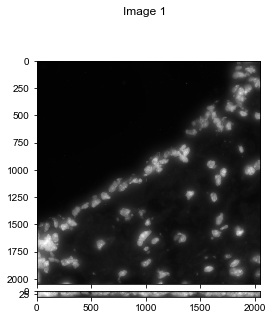

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_061_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_061_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


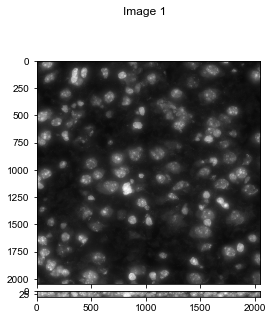

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_062_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_062_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


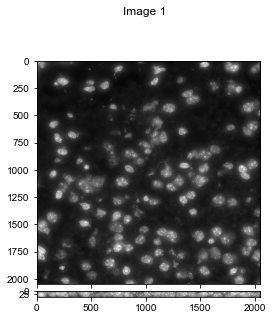

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_063_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_063_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


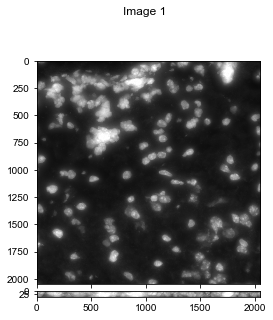

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_064_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_064_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


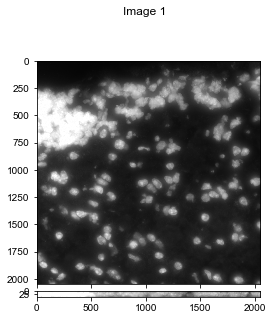

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_065_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_065_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


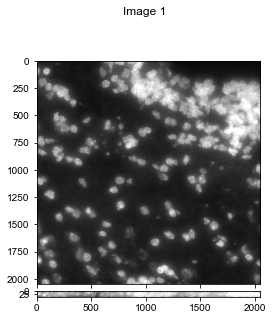

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_066_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_066_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


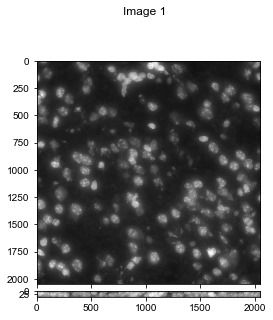

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_067_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_067_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


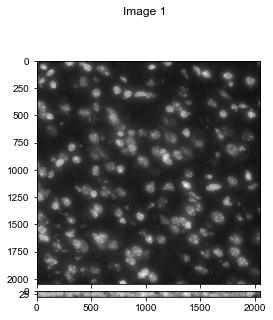

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_068_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_068_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


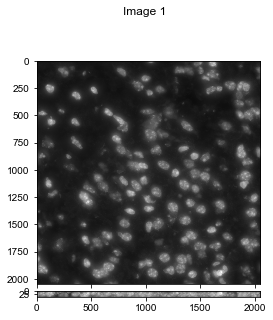

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_069_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_069_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


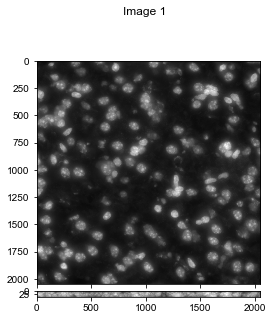

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_070_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_070_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


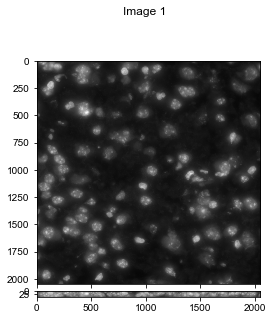

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_071_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_071_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


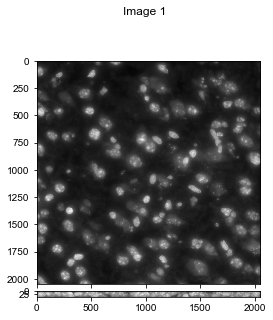

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_072_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_072_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


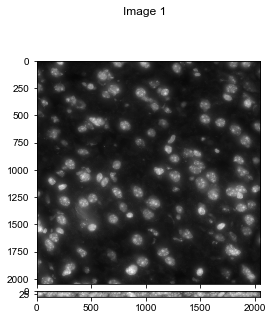

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_073_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_073_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


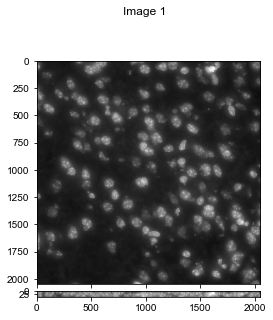

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_074_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_074_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


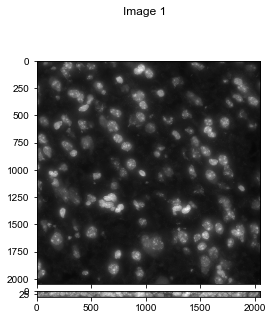

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_075_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_075_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


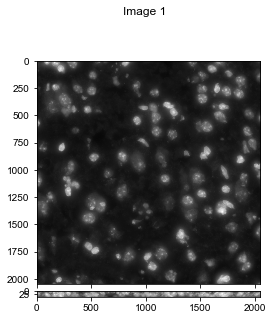

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_076_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_076_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


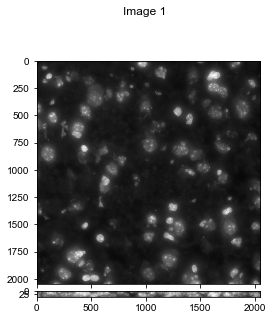

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_077_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_077_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


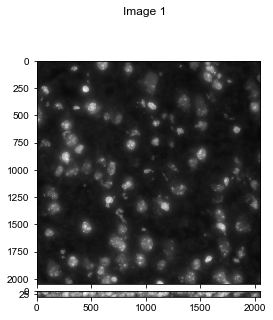

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_078_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_078_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


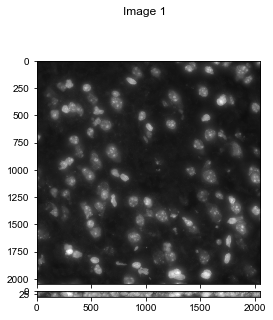

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_079_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_079_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


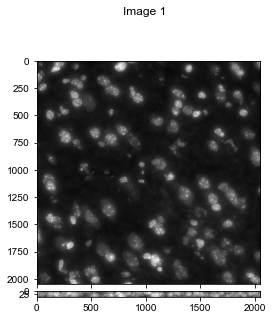

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_080_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_080_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


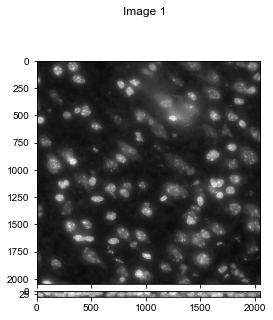

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_081_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_081_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


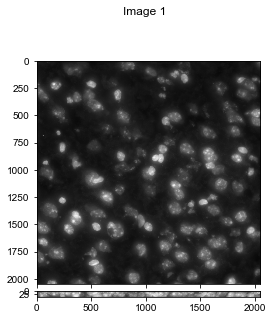

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_082_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_082_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


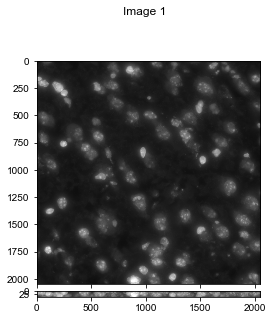

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_083_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_083_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


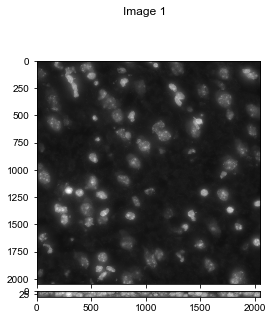

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_084_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_084_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


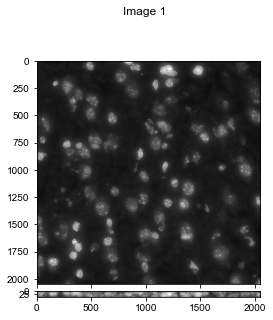

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_085_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_085_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


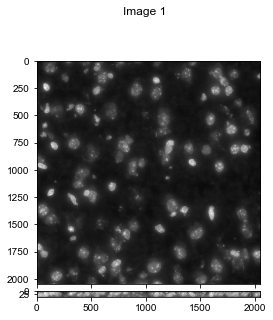

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_086_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_086_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


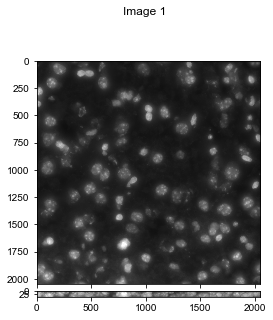

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_087_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_087_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


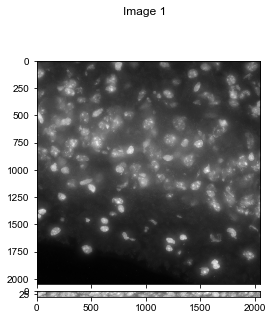

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_088_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_088_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


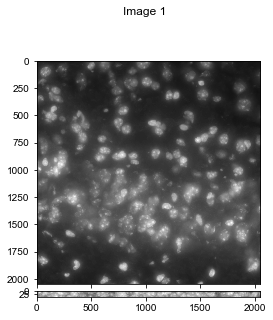

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_089_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_089_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


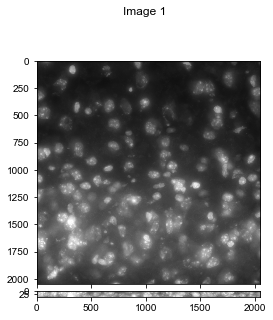

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_090_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_090_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


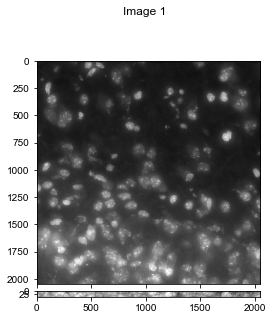

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_091_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_091_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


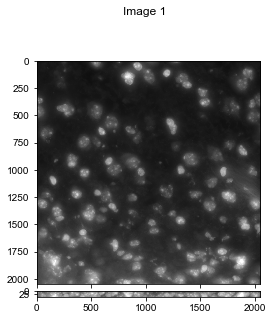

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_092_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_092_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


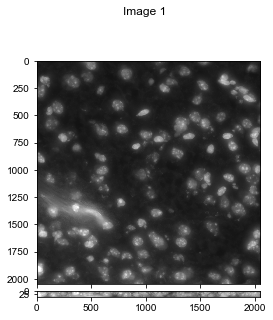

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_093_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_093_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


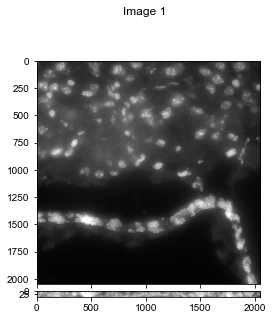

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_094_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_094_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


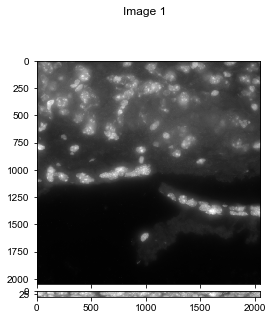

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_095_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_095_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


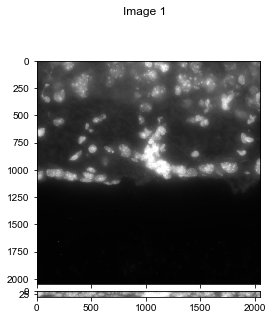

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_096_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_096_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


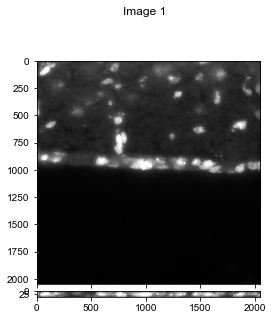

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_097_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_097_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


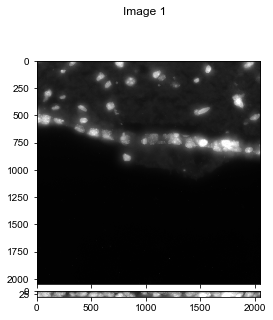

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_098_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_098_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


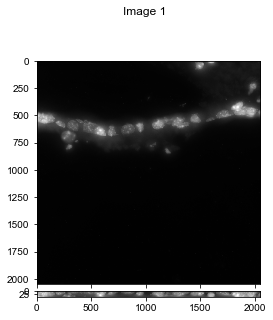

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_099_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_099_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


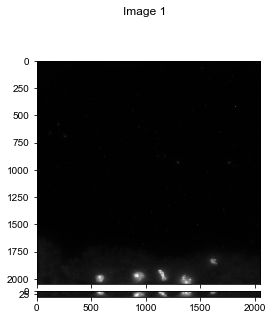

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_100_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_100_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


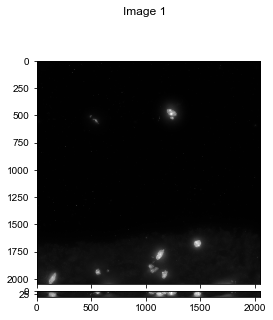

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_101_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_101_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


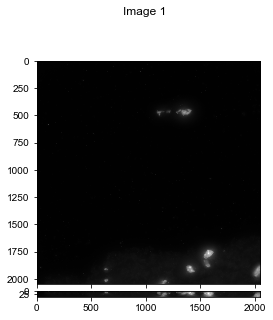

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_102_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_102_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


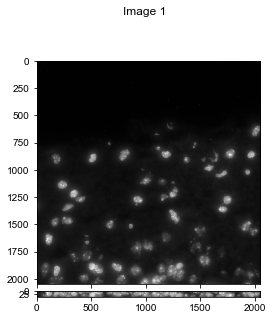

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_103_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_103_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


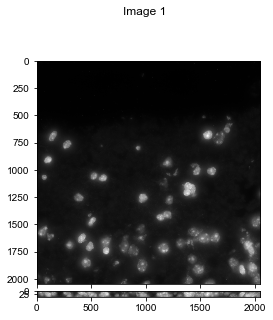

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_104_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_104_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


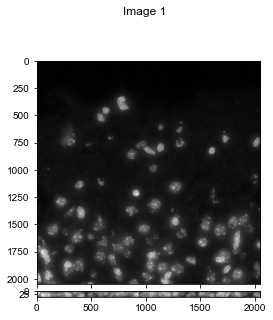

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_105_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_105_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


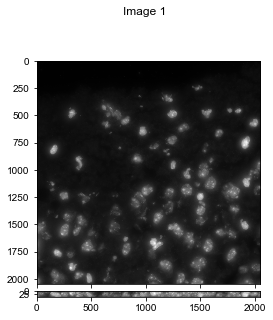

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_106_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_106_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


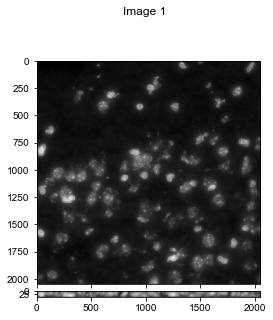

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_107_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_107_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


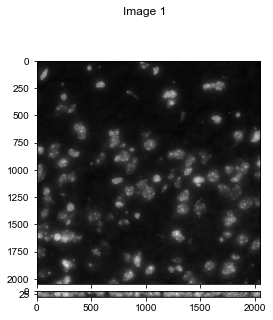

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_108_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_108_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


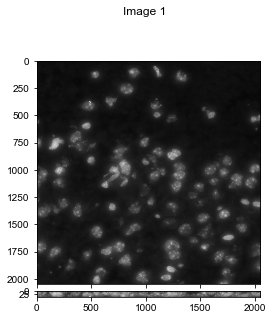

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_109_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_109_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


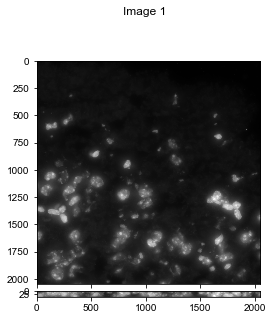

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_110_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_110_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


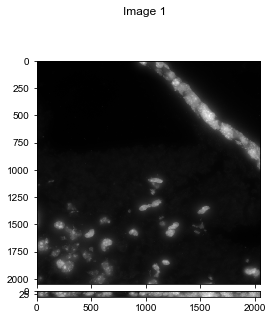

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_111_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_111_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


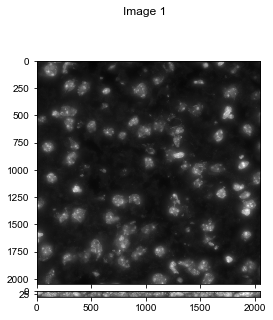

-- loading mask from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_112_Segmentation.npy
-- segmentation_masks already exist, skip.
-- save_file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_112_Segmentation.npy already exists, skip. 
-- removing segmentation_masks from class


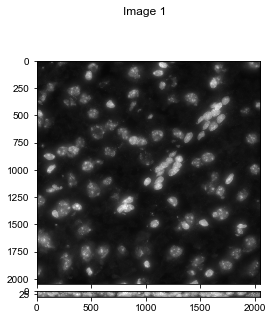

2021-12-28 22:40:02,535 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 22:40:02,535 [INFO] >>>> using GPU
2021-12-28 22:40:02,771 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 22:40:02,771 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 22:40:04,057 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 22:40:27,052 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.45it/s]
2021-12-28 22:40:27,683 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 22:40:33,240 [INFO] 99%|#########8| 80/81 [00:05<00:00, 15.00it/s]


2021-12-28 22:40:47,566 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.91it/s]


2021-12-28 22:40:50,291 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.99it/s]
2021-12-28 22:40:51,409 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 22:41:02,706 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.88it/s]


2021-12-28 22:41:14,180 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.84it/s]
2021-12-28 22:41:15,280 [INFO] network run in 71.88s
2021-12-28 22:41:37,634 [INFO] masks created in 22.35s
2021-12-28 22:41:41,628 [INFO] >>>> TOTAL TIME 98.86 sec
-- finish segmentation in 99.531s. 


C:\Users\puzheng\anaconda3\envs\ia3\lib\site-packages\skimage\segmentation\random_walker_segmentation.py:470: UserWarning: Random walker only segments unlabeled areas, where labels == 0. No zero valued areas in labels were found. Returning provided labels.
  inds_isolated_seeds, isolated_values) = _preprocess(labels)


-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_113_Segmentation.npy
-- removing segmentation_masks from class


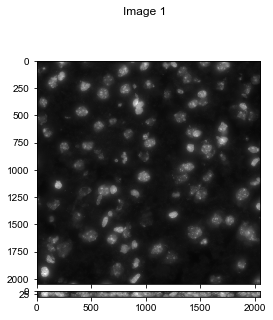

2021-12-28 22:41:53,988 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 22:41:53,988 [INFO] >>>> using GPU
2021-12-28 22:41:54,129 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 22:41:54,129 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 22:41:55,410 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 22:42:11,714 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.43it/s]
2021-12-28 22:42:12,360 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 22:42:17,957 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.67it/s]


2021-12-28 22:42:32,364 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.73it/s]


2021-12-28 22:42:35,114 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.82it/s]
2021-12-28 22:42:36,146 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 22:42:47,521 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.81it/s]


2021-12-28 22:42:58,896 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.89it/s]
2021-12-28 22:42:59,974 [INFO] network run in 65.20s
2021-12-28 22:43:20,350 [INFO] masks created in 20.38s
2021-12-28 22:43:24,363 [INFO] >>>> TOTAL TIME 90.23 sec
-- finish segmentation in 90.737s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_114_Segmentation.npy
-- removing segmentation_masks from class


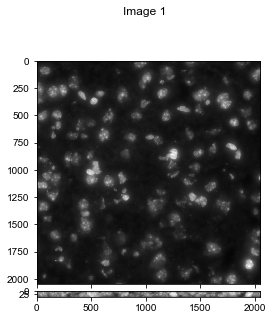

2021-12-28 22:43:36,046 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 22:43:36,047 [INFO] >>>> using GPU
2021-12-28 22:43:36,194 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 22:43:36,194 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 22:43:37,459 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 22:43:53,766 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.43it/s]
2021-12-28 22:43:54,382 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 22:43:59,991 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.91it/s]


2021-12-28 22:44:14,523 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.90it/s]


2021-12-28 22:44:17,269 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.82it/s]
2021-12-28 22:44:18,348 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 22:44:29,702 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.79it/s]


2021-12-28 22:44:41,086 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.89it/s]
2021-12-28 22:44:42,195 [INFO] network run in 65.39s
2021-12-28 22:45:02,635 [INFO] masks created in 20.44s
2021-12-28 22:45:06,555 [INFO] >>>> TOTAL TIME 90.36 sec
-- finish segmentation in 90.831s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_115_Segmentation.npy
-- removing segmentation_masks from class


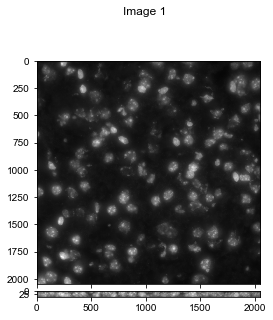

2021-12-28 22:45:18,102 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 22:45:18,102 [INFO] >>>> using GPU
2021-12-28 22:45:18,259 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 22:45:18,259 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 22:45:19,621 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 22:45:35,822 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.43it/s]
2021-12-28 22:45:36,460 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 22:45:42,052 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.87it/s]


2021-12-28 22:45:56,432 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.85it/s]


2021-12-28 22:45:59,166 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.87it/s]
2021-12-28 22:46:00,213 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 22:46:11,526 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.81it/s]


2021-12-28 22:46:22,995 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.81it/s]
2021-12-28 22:46:24,089 [INFO] network run in 65.20s
2021-12-28 22:46:46,355 [INFO] masks created in 22.27s
2021-12-28 22:46:50,446 [INFO] >>>> TOTAL TIME 92.19 sec
-- finish segmentation in 92.683s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_116_Segmentation.npy
-- removing segmentation_masks from class


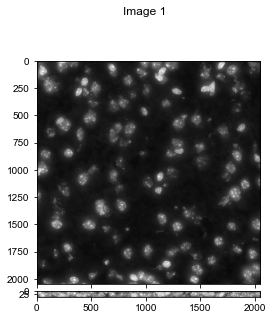

2021-12-28 22:47:02,108 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 22:47:02,108 [INFO] >>>> using GPU
2021-12-28 22:47:02,269 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 22:47:02,270 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 22:47:03,613 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 22:47:19,983 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.43it/s]
2021-12-28 22:47:20,636 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 22:47:26,278 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.90it/s]


2021-12-28 22:47:40,700 [INFO] 49%|####9     | 40/81 [00:02<00:02, 15.05it/s]


2021-12-28 22:47:43,470 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.76it/s]
2021-12-28 22:47:44,496 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 22:47:55,872 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.71it/s]


2021-12-28 22:48:07,310 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.69it/s]
2021-12-28 22:48:08,421 [INFO] network run in 65.48s
2021-12-28 22:48:29,593 [INFO] masks created in 21.17s
2021-12-28 22:48:33,531 [INFO] >>>> TOTAL TIME 91.26 sec
-- finish segmentation in 91.722s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_117_Segmentation.npy
-- removing segmentation_masks from class


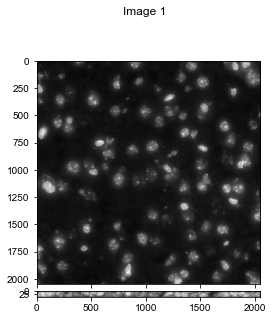

2021-12-28 22:48:45,217 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 22:48:45,218 [INFO] >>>> using GPU
2021-12-28 22:48:45,373 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 22:48:45,374 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 22:48:46,672 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 22:49:02,842 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.45it/s]
2021-12-28 22:49:03,483 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 22:49:09,026 [INFO] 99%|#########8| 80/81 [00:05<00:00, 15.07it/s]


2021-12-28 22:49:23,437 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.97it/s]


2021-12-28 22:49:26,188 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.85it/s]
2021-12-28 22:49:27,174 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 22:49:38,594 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.64it/s]


2021-12-28 22:49:50,125 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.69it/s]
2021-12-28 22:49:51,234 [INFO] network run in 65.22s
2021-12-28 22:50:11,753 [INFO] masks created in 20.50s
2021-12-28 22:50:15,678 [INFO] >>>> TOTAL TIME 90.30 sec
-- finish segmentation in 90.804s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_118_Segmentation.npy
-- removing segmentation_masks from class


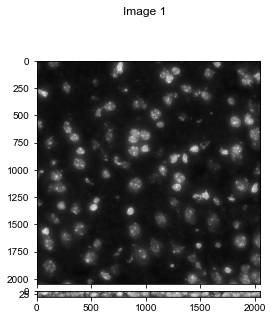

2021-12-28 22:50:27,454 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 22:50:27,454 [INFO] >>>> using GPU
2021-12-28 22:50:27,626 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 22:50:27,627 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 22:50:28,949 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 22:50:45,192 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 22:50:45,841 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 22:50:51,439 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.72it/s]


2021-12-28 22:51:05,986 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.78it/s]


2021-12-28 22:51:08,768 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.74it/s]
2021-12-28 22:51:09,954 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 22:51:21,393 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.77it/s]


2021-12-28 22:51:32,971 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.55it/s]
2021-12-28 22:51:34,061 [INFO] network run in 65.73s
2021-12-28 22:51:54,951 [INFO] masks created in 20.89s
2021-12-28 22:51:58,878 [INFO] >>>> TOTAL TIME 91.25 sec
-- finish segmentation in 91.775s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_119_Segmentation.npy
-- removing segmentation_masks from class


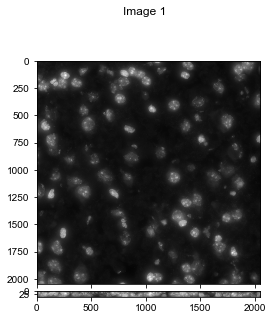

2021-12-28 22:52:10,504 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 22:52:10,504 [INFO] >>>> using GPU
2021-12-28 22:52:10,644 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 22:52:10,644 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 22:52:11,972 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 22:52:28,254 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 22:52:28,879 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 22:52:34,488 [INFO] 99%|#########8| 80/81 [00:05<00:00, 15.16it/s]


2021-12-28 22:52:48,973 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.99it/s]


2021-12-28 22:52:51,739 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.76it/s]
2021-12-28 22:52:52,769 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 22:53:04,255 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.49it/s]


2021-12-28 22:53:15,817 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.59it/s]
2021-12-28 22:53:16,833 [INFO] network run in 65.49s
2021-12-28 22:53:38,099 [INFO] masks created in 21.27s
2021-12-28 22:53:42,126 [INFO] >>>> TOTAL TIME 91.48 sec
-- finish segmentation in 91.957s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_120_Segmentation.npy
-- removing segmentation_masks from class


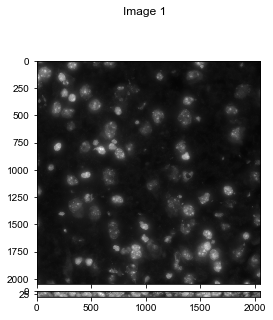

2021-12-28 22:53:54,088 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 22:53:54,088 [INFO] >>>> using GPU
2021-12-28 22:53:54,240 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 22:53:54,240 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 22:53:55,521 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 22:54:11,818 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.43it/s]
2021-12-28 22:54:12,468 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 22:54:18,026 [INFO] 99%|#########8| 80/81 [00:05<00:00, 15.06it/s]


2021-12-28 22:54:32,273 [INFO] 47%|####6     | 38/81 [00:02<00:02, 14.90it/s]


2021-12-28 22:54:35,163 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.81it/s]
2021-12-28 22:54:36,221 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 22:54:47,593 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.84it/s]


2021-12-28 22:54:59,107 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.77it/s]
2021-12-28 22:55:00,164 [INFO] network run in 65.26s
2021-12-28 22:55:20,820 [INFO] masks created in 20.66s
2021-12-28 22:55:24,742 [INFO] >>>> TOTAL TIME 90.50 sec
-- finish segmentation in 90.985s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_121_Segmentation.npy
-- removing segmentation_masks from class


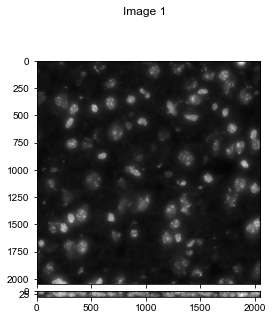

2021-12-28 22:55:36,180 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 22:55:36,180 [INFO] >>>> using GPU
2021-12-28 22:55:36,337 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 22:55:36,337 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 22:55:37,603 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 22:55:53,931 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 22:55:54,611 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 22:56:00,258 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.84it/s]


2021-12-28 22:56:14,853 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.54it/s]


2021-12-28 22:56:17,664 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.57it/s]
2021-12-28 22:56:18,774 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 22:56:30,322 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.56it/s]


2021-12-28 22:56:41,962 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.56it/s]
2021-12-28 22:56:43,057 [INFO] network run in 66.06s
2021-12-28 22:57:04,354 [INFO] masks created in 21.30s
2021-12-28 22:57:08,495 [INFO] >>>> TOTAL TIME 92.16 sec
-- finish segmentation in 92.643s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_122_Segmentation.npy
-- removing segmentation_masks from class


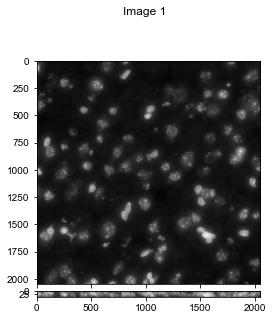

2021-12-28 22:57:20,542 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 22:57:20,542 [INFO] >>>> using GPU
2021-12-28 22:57:20,683 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 22:57:20,699 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 22:57:22,035 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 22:57:38,418 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.42it/s]
2021-12-28 22:57:39,129 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 22:57:44,761 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.89it/s]


2021-12-28 22:57:59,407 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.85it/s]


2021-12-28 22:58:02,180 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.70it/s]
2021-12-28 22:58:03,244 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 22:58:14,804 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.49it/s]


2021-12-28 22:58:26,394 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.55it/s]
2021-12-28 22:58:27,607 [INFO] network run in 66.25s
2021-12-28 22:58:50,116 [INFO] masks created in 22.51s
2021-12-28 22:58:54,294 [INFO] >>>> TOTAL TIME 93.61 sec
-- finish segmentation in 94.124s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_123_Segmentation.npy
-- removing segmentation_masks from class


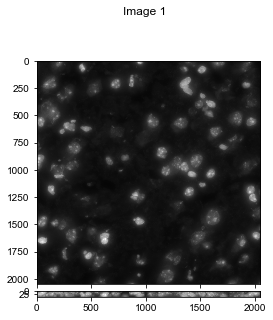

2021-12-28 22:59:06,596 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 22:59:06,596 [INFO] >>>> using GPU
2021-12-28 22:59:06,753 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 22:59:06,753 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 22:59:08,047 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 22:59:24,454 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.38it/s]
2021-12-28 22:59:25,124 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 22:59:30,764 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.65it/s]


2021-12-28 22:59:45,249 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.67it/s]


2021-12-28 22:59:48,044 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.73it/s]
2021-12-28 22:59:49,140 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:00:00,656 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.52it/s]


2021-12-28 23:00:12,348 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.69it/s]
2021-12-28 23:00:13,522 [INFO] network run in 66.11s
2021-12-28 23:00:33,291 [INFO] masks created in 19.77s
2021-12-28 23:00:37,435 [INFO] >>>> TOTAL TIME 90.68 sec
-- finish segmentation in 91.172s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_124_Segmentation.npy
-- removing segmentation_masks from class


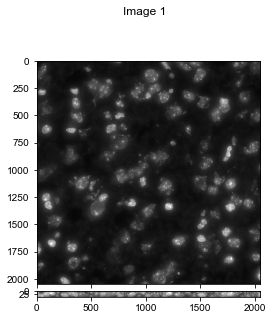

2021-12-28 23:00:49,120 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:00:49,120 [INFO] >>>> using GPU
2021-12-28 23:00:49,279 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:00:49,279 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:00:50,688 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:01:07,174 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.39it/s]
2021-12-28 23:01:07,849 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:01:13,486 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.98it/s]


2021-12-28 23:01:28,111 [INFO] 49%|####9     | 40/81 [00:02<00:02, 13.97it/s]


2021-12-28 23:01:30,886 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.58it/s]
2021-12-28 23:01:32,004 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:01:43,565 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.62it/s]


2021-12-28 23:01:55,215 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.71it/s]
2021-12-28 23:01:56,360 [INFO] network run in 66.41s
2021-12-28 23:02:19,679 [INFO] masks created in 23.32s
2021-12-28 23:02:23,690 [INFO] >>>> TOTAL TIME 94.41 sec
-- finish segmentation in 94.923s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_125_Segmentation.npy
-- removing segmentation_masks from class


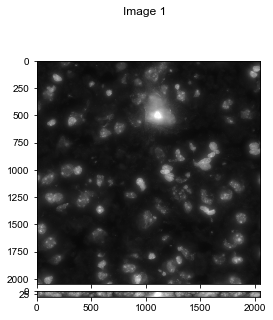

2021-12-28 23:02:35,570 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:02:35,570 [INFO] >>>> using GPU
2021-12-28 23:02:35,727 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:02:35,728 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:02:37,066 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:02:53,498 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.40it/s]
2021-12-28 23:02:54,177 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:02:59,785 [INFO] 99%|#########8| 80/81 [00:05<00:00, 15.08it/s]


2021-12-28 23:03:14,439 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.39it/s]


2021-12-28 23:03:17,260 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.53it/s]
2021-12-28 23:03:18,363 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:03:29,870 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.55it/s]


2021-12-28 23:03:41,528 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.54it/s]
2021-12-28 23:03:42,692 [INFO] network run in 66.33s
2021-12-28 23:04:03,162 [INFO] masks created in 20.47s
2021-12-28 23:04:07,380 [INFO] >>>> TOTAL TIME 91.65 sec
-- finish segmentation in 92.154s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_126_Segmentation.npy
-- removing segmentation_masks from class


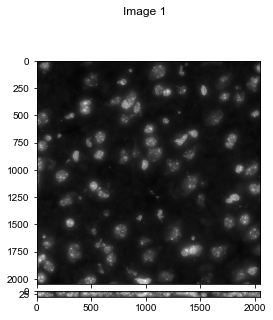

2021-12-28 23:04:19,402 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:04:19,403 [INFO] >>>> using GPU
2021-12-28 23:04:19,556 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:04:19,556 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:04:20,802 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:04:37,115 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 23:04:37,756 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:04:43,420 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.69it/s]


2021-12-28 23:04:58,008 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.67it/s]


2021-12-28 23:05:00,788 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.68it/s]
2021-12-28 23:05:01,918 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:05:13,409 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.61it/s]


2021-12-28 23:05:25,095 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.53it/s]
2021-12-28 23:05:26,175 [INFO] network run in 65.98s
2021-12-28 23:05:48,219 [INFO] masks created in 22.04s
2021-12-28 23:05:52,399 [INFO] >>>> TOTAL TIME 92.84 sec
-- finish segmentation in 93.326s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_127_Segmentation.npy
-- removing segmentation_masks from class


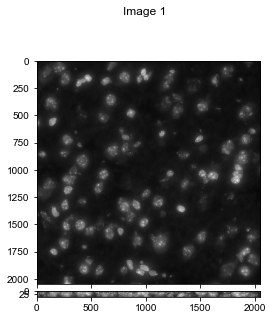

2021-12-28 23:06:04,474 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:06:04,475 [INFO] >>>> using GPU
2021-12-28 23:06:04,683 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:06:04,684 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:06:06,118 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:06:22,552 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.43it/s]
2021-12-28 23:06:23,239 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:06:28,932 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.70it/s]


2021-12-28 23:06:43,553 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.64it/s]


2021-12-28 23:06:46,337 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.71it/s]
2021-12-28 23:06:47,431 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:06:58,916 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.75it/s]


2021-12-28 23:07:10,635 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.28it/s]
2021-12-28 23:07:11,729 [INFO] network run in 66.31s
2021-12-28 23:07:33,276 [INFO] masks created in 21.55s
2021-12-28 23:07:37,443 [INFO] >>>> TOTAL TIME 92.76 sec
-- finish segmentation in 93.287s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_128_Segmentation.npy
-- removing segmentation_masks from class


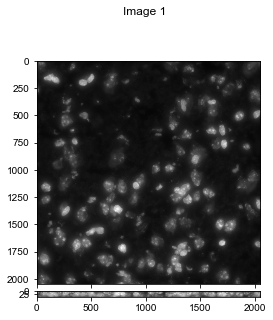

2021-12-28 23:07:49,292 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:07:49,292 [INFO] >>>> using GPU
2021-12-28 23:07:49,464 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:07:49,464 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:07:50,803 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:08:07,257 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.46it/s]
2021-12-28 23:08:07,902 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:08:13,573 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.80it/s]


2021-12-28 23:08:28,059 [INFO] 49%|####9     | 40/81 [00:02<00:02, 15.00it/s]


2021-12-28 23:08:30,824 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.78it/s]
2021-12-28 23:08:31,882 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:08:43,465 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.64it/s]


2021-12-28 23:08:55,150 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.49it/s]
2021-12-28 23:08:56,278 [INFO] network run in 66.16s
2021-12-28 23:09:18,054 [INFO] masks created in 21.78s
2021-12-28 23:09:22,178 [INFO] >>>> TOTAL TIME 92.71 sec
-- finish segmentation in 93.241s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_129_Segmentation.npy
-- removing segmentation_masks from class


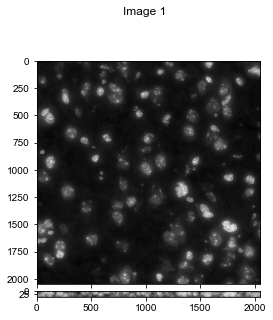

2021-12-28 23:09:34,045 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:09:34,045 [INFO] >>>> using GPU
2021-12-28 23:09:34,232 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:09:34,232 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:09:35,529 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:09:51,826 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.45it/s]
2021-12-28 23:09:52,483 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:09:58,124 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.87it/s]


2021-12-28 23:10:12,577 [INFO] 47%|####6     | 38/81 [00:02<00:02, 14.66it/s]


2021-12-28 23:10:15,483 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.73it/s]
2021-12-28 23:10:16,561 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:10:27,952 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.37it/s]


2021-12-28 23:10:39,609 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.60it/s]
2021-12-28 23:10:40,656 [INFO] network run in 65.77s
2021-12-28 23:11:02,750 [INFO] masks created in 22.09s
2021-12-28 23:11:06,896 [INFO] >>>> TOTAL TIME 92.66 sec
-- finish segmentation in 93.158s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_130_Segmentation.npy
-- removing segmentation_masks from class


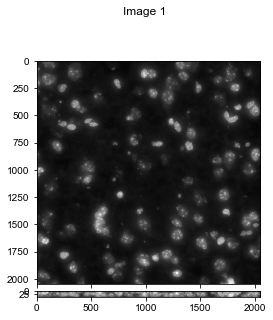

2021-12-28 23:11:18,657 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:11:18,657 [INFO] >>>> using GPU
2021-12-28 23:11:18,813 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:11:18,813 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:11:20,170 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:11:36,423 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.45it/s]
2021-12-28 23:11:37,063 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:11:42,688 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.73it/s]


2021-12-28 23:11:57,079 [INFO] 47%|####6     | 38/81 [00:02<00:02, 14.62it/s]


2021-12-28 23:12:00,017 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.64it/s]
2021-12-28 23:12:01,048 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:12:12,455 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.67it/s]


2021-12-28 23:12:24,158 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.52it/s]
2021-12-28 23:12:25,268 [INFO] network run in 65.83s
2021-12-28 23:12:47,018 [INFO] masks created in 21.75s
2021-12-28 23:12:51,081 [INFO] >>>> TOTAL TIME 92.27 sec
-- finish segmentation in 92.752s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_131_Segmentation.npy
-- removing segmentation_masks from class


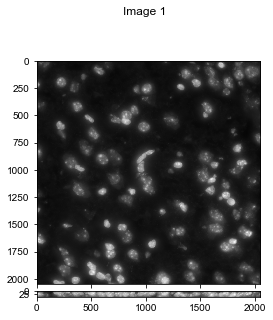

2021-12-28 23:13:02,815 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:13:02,815 [INFO] >>>> using GPU
2021-12-28 23:13:02,973 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:13:02,975 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:13:04,284 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:13:20,628 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 23:13:21,253 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:13:26,896 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.45it/s]


2021-12-28 23:13:41,395 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.71it/s]


2021-12-28 23:13:44,192 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.64it/s]
2021-12-28 23:13:45,348 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:13:56,770 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.75it/s]


2021-12-28 23:14:08,411 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.36it/s]
2021-12-28 23:14:09,526 [INFO] network run in 65.93s
2021-12-28 23:14:32,132 [INFO] masks created in 22.61s
2021-12-28 23:14:36,177 [INFO] >>>> TOTAL TIME 93.20 sec
-- finish segmentation in 93.696s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_132_Segmentation.npy
-- removing segmentation_masks from class


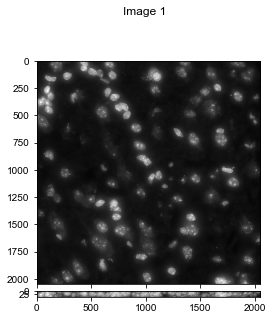

2021-12-28 23:14:48,022 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:14:48,022 [INFO] >>>> using GPU
2021-12-28 23:14:48,177 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:14:48,177 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:14:49,490 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:15:05,835 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 23:15:06,490 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:15:12,109 [INFO] 98%|#########7| 79/81 [00:05<00:00, 14.85it/s]


2021-12-28 23:15:26,603 [INFO] 47%|####6     | 38/81 [00:02<00:02, 14.42it/s]


2021-12-28 23:15:29,530 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.62it/s]
2021-12-28 23:15:30,622 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:15:42,125 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.77it/s]


2021-12-28 23:15:53,835 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.54it/s]
2021-12-28 23:15:54,923 [INFO] network run in 66.06s
2021-12-28 23:16:17,260 [INFO] masks created in 22.34s
2021-12-28 23:16:21,234 [INFO] >>>> TOTAL TIME 93.06 sec
-- finish segmentation in 93.537s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_133_Segmentation.npy
-- removing segmentation_masks from class


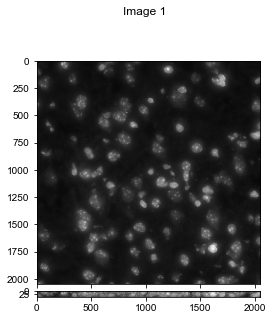

2021-12-28 23:16:32,979 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:16:32,980 [INFO] >>>> using GPU
2021-12-28 23:16:33,129 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:16:33,130 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:16:34,457 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:16:50,774 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 23:16:51,415 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:16:57,071 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.54it/s]


2021-12-28 23:17:11,665 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.60it/s]


2021-12-28 23:17:14,437 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.74it/s]
2021-12-28 23:17:15,497 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:17:27,035 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.63it/s]


2021-12-28 23:17:38,599 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.62it/s]
2021-12-28 23:17:39,724 [INFO] network run in 65.93s
2021-12-28 23:18:02,415 [INFO] masks created in 22.69s
2021-12-28 23:18:06,512 [INFO] >>>> TOTAL TIME 93.38 sec
-- finish segmentation in 93.861s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_134_Segmentation.npy
-- removing segmentation_masks from class


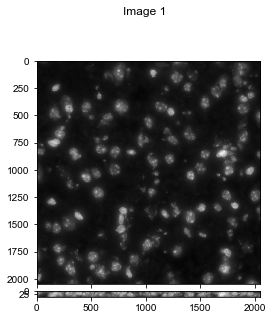

2021-12-28 23:18:18,430 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:18:18,431 [INFO] >>>> using GPU
2021-12-28 23:18:18,596 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:18:18,597 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:18:19,900 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:18:36,403 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.39it/s]
2021-12-28 23:18:37,047 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:18:42,707 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.72it/s]


2021-12-28 23:18:57,099 [INFO] 47%|####6     | 38/81 [00:02<00:02, 14.44it/s]


2021-12-28 23:19:00,027 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.65it/s]
2021-12-28 23:19:01,168 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:19:12,618 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.55it/s]


2021-12-28 23:19:24,258 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.70it/s]
2021-12-28 23:19:25,341 [INFO] network run in 66.11s
2021-12-28 23:19:47,831 [INFO] masks created in 22.49s
2021-12-28 23:19:51,935 [INFO] >>>> TOTAL TIME 93.34 sec
-- finish segmentation in 93.846s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_135_Segmentation.npy
-- removing segmentation_masks from class


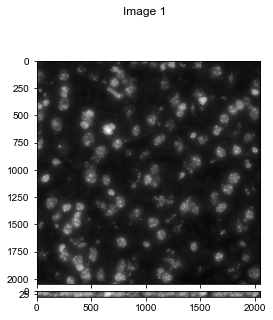

2021-12-28 23:20:03,881 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:20:03,881 [INFO] >>>> using GPU
2021-12-28 23:20:04,040 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:20:04,041 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:20:05,390 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:20:21,764 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 23:20:22,452 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:20:28,045 [INFO] 99%|#########8| 80/81 [00:05<00:00, 15.11it/s]


2021-12-28 23:20:42,624 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.89it/s]


2021-12-28 23:20:45,452 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.56it/s]
2021-12-28 23:20:46,547 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:20:58,092 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.56it/s]


2021-12-28 23:21:09,884 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.38it/s]
2021-12-28 23:21:10,968 [INFO] network run in 66.25s
2021-12-28 23:21:33,734 [INFO] masks created in 22.77s
2021-12-28 23:21:37,750 [INFO] >>>> TOTAL TIME 93.71 sec
-- finish segmentation in 94.199s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_136_Segmentation.npy
-- removing segmentation_masks from class


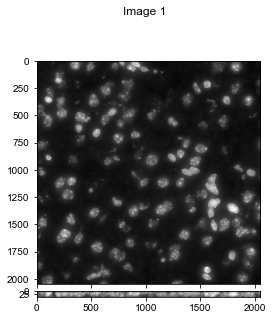

2021-12-28 23:21:49,500 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:21:49,500 [INFO] >>>> using GPU
2021-12-28 23:21:49,657 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:21:49,657 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:21:51,045 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:22:07,470 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 23:22:08,111 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:22:13,767 [INFO] 99%|#########8| 80/81 [00:05<00:00, 15.16it/s]


2021-12-28 23:22:28,367 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.80it/s]


2021-12-28 23:22:31,152 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.70it/s]
2021-12-28 23:22:32,304 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:22:43,878 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.78it/s]


2021-12-28 23:22:55,501 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.65it/s]
2021-12-28 23:22:56,581 [INFO] network run in 66.21s
2021-12-28 23:23:19,018 [INFO] masks created in 22.44s
2021-12-28 23:23:22,919 [INFO] >>>> TOTAL TIME 93.26 sec
-- finish segmentation in 93.737s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_137_Segmentation.npy
-- removing segmentation_masks from class


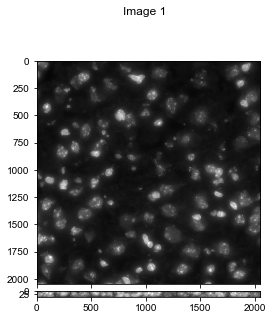

2021-12-28 23:23:34,855 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:23:34,855 [INFO] >>>> using GPU
2021-12-28 23:23:35,043 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:23:35,043 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:23:36,456 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:23:52,761 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 23:23:53,437 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:23:59,074 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.69it/s]


2021-12-28 23:24:13,654 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.72it/s]


2021-12-28 23:24:16,455 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.56it/s]
2021-12-28 23:24:17,504 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:24:28,995 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.56it/s]


2021-12-28 23:24:40,710 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.72it/s]
2021-12-28 23:24:41,786 [INFO] network run in 66.04s
2021-12-28 23:25:05,365 [INFO] masks created in 23.58s
2021-12-28 23:25:09,458 [INFO] >>>> TOTAL TIME 94.42 sec
-- finish segmentation in 94.933s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_138_Segmentation.npy
-- removing segmentation_masks from class


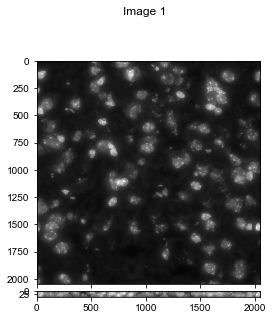

2021-12-28 23:25:21,568 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:25:21,568 [INFO] >>>> using GPU
2021-12-28 23:25:21,740 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:25:21,740 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:25:23,038 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:25:39,460 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 23:25:40,117 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:25:45,805 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.64it/s]


2021-12-28 23:26:00,382 [INFO] 49%|####9     | 40/81 [00:02<00:02, 15.01it/s]


2021-12-28 23:26:03,180 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.60it/s]
2021-12-28 23:26:04,241 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:26:15,899 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.40it/s]


2021-12-28 23:26:27,484 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.63it/s]
2021-12-28 23:26:28,615 [INFO] network run in 66.22s
2021-12-28 23:26:51,349 [INFO] masks created in 22.73s
2021-12-28 23:26:55,446 [INFO] >>>> TOTAL TIME 93.71 sec
-- finish segmentation in 94.221s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_139_Segmentation.npy
-- removing segmentation_masks from class


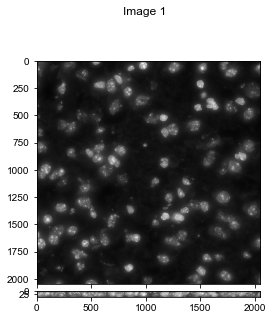

2021-12-28 23:27:07,291 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:27:07,291 [INFO] >>>> using GPU
2021-12-28 23:27:07,430 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:27:07,430 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:27:08,711 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:27:25,024 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 23:27:25,681 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:27:31,330 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.69it/s]


2021-12-28 23:27:45,990 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.72it/s]


2021-12-28 23:27:48,776 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.68it/s]
2021-12-28 23:27:49,931 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:28:01,435 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.59it/s]


2021-12-28 23:28:13,222 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.56it/s]
2021-12-28 23:28:14,330 [INFO] network run in 66.20s
2021-12-28 23:28:37,282 [INFO] masks created in 22.95s
2021-12-28 23:28:41,425 [INFO] >>>> TOTAL TIME 94.00 sec
-- finish segmentation in 94.492s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_140_Segmentation.npy
-- removing segmentation_masks from class


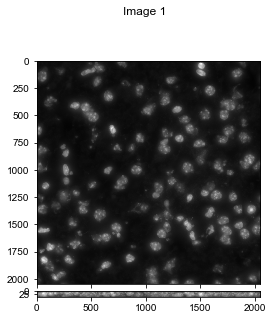

2021-12-28 23:28:53,604 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:28:53,604 [INFO] >>>> using GPU
2021-12-28 23:28:53,750 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:28:53,750 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:28:55,081 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:29:11,398 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 23:29:12,052 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:29:17,719 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.53it/s]


2021-12-28 23:29:32,414 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.73it/s]


2021-12-28 23:29:35,192 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.65it/s]
2021-12-28 23:29:36,319 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:29:47,821 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.62it/s]


2021-12-28 23:29:59,540 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.55it/s]
2021-12-28 23:30:00,695 [INFO] network run in 66.25s
2021-12-28 23:30:23,919 [INFO] masks created in 23.22s
2021-12-28 23:30:27,986 [INFO] >>>> TOTAL TIME 94.24 sec
-- finish segmentation in 94.742s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_141_Segmentation.npy
-- removing segmentation_masks from class


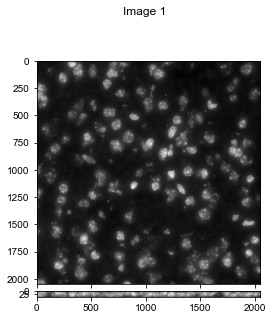

2021-12-28 23:30:40,422 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:30:40,423 [INFO] >>>> using GPU
2021-12-28 23:30:40,576 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:30:40,576 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:30:41,888 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:30:58,357 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.41it/s]
2021-12-28 23:30:59,014 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:31:04,686 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.41it/s]


2021-12-28 23:31:19,405 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.74it/s]


2021-12-28 23:31:22,184 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.61it/s]
2021-12-28 23:31:23,331 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:31:34,905 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.58it/s]


2021-12-28 23:31:46,655 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.28it/s]
2021-12-28 23:31:47,780 [INFO] network run in 66.53s
2021-12-28 23:32:11,427 [INFO] masks created in 23.65s
2021-12-28 23:32:15,686 [INFO] >>>> TOTAL TIME 95.11 sec
-- finish segmentation in 95.609s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_142_Segmentation.npy
-- removing segmentation_masks from class


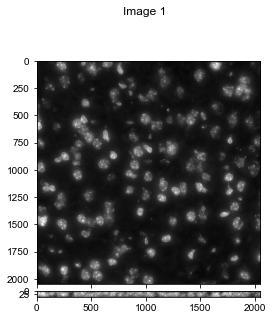

2021-12-28 23:32:27,796 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:32:27,796 [INFO] >>>> using GPU
2021-12-28 23:32:27,953 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:32:27,953 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:32:29,202 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:32:45,495 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 23:32:46,143 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:32:51,767 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.98it/s]


2021-12-28 23:33:06,406 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.64it/s]


2021-12-28 23:33:09,192 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.65it/s]
2021-12-28 23:33:10,220 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:33:21,667 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.70it/s]


2021-12-28 23:33:33,219 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.69it/s]
2021-12-28 23:33:34,313 [INFO] network run in 65.74s
2021-12-28 23:33:57,001 [INFO] masks created in 22.69s
2021-12-28 23:34:01,094 [INFO] >>>> TOTAL TIME 93.14 sec
-- finish segmentation in 93.642s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_143_Segmentation.npy
-- removing segmentation_masks from class


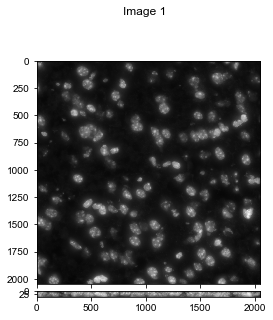

2021-12-28 23:34:13,076 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:34:13,077 [INFO] >>>> using GPU
2021-12-28 23:34:13,240 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:34:13,240 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:34:14,596 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:34:31,088 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.43it/s]
2021-12-28 23:34:31,751 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:34:37,362 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.57it/s]


2021-12-28 23:34:51,926 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.43it/s]


2021-12-28 23:34:54,697 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.73it/s]
2021-12-28 23:34:55,746 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:35:07,236 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.60it/s]


2021-12-28 23:35:19,080 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.42it/s]
2021-12-28 23:35:20,189 [INFO] network run in 66.31s
2021-12-28 23:35:44,143 [INFO] masks created in 23.95s
2021-12-28 23:35:48,206 [INFO] >>>> TOTAL TIME 94.97 sec
-- finish segmentation in 95.443s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_144_Segmentation.npy
-- removing segmentation_masks from class


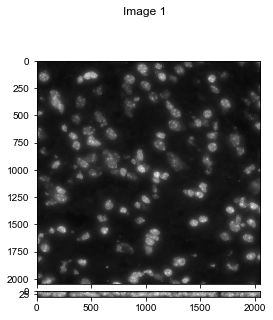

2021-12-28 23:35:59,815 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:35:59,815 [INFO] >>>> using GPU
2021-12-28 23:35:59,971 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:35:59,971 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:36:01,206 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:36:17,609 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.46it/s]
2021-12-28 23:36:18,237 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:36:23,878 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.84it/s]


2021-12-28 23:36:38,353 [INFO] 48%|####8     | 39/81 [00:02<00:02, 14.57it/s]


2021-12-28 23:36:41,217 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.50it/s]
2021-12-28 23:36:42,226 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:36:53,644 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.76it/s]


2021-12-28 23:37:05,300 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.52it/s]
2021-12-28 23:37:06,394 [INFO] network run in 65.81s
2021-12-28 23:37:27,552 [INFO] masks created in 21.16s
2021-12-28 23:37:31,685 [INFO] >>>> TOTAL TIME 91.71 sec
-- finish segmentation in 92.211s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_145_Segmentation.npy
-- removing segmentation_masks from class


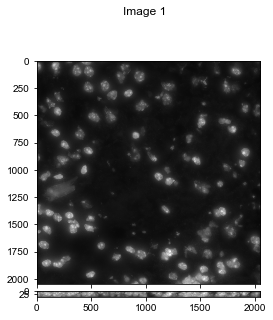

2021-12-28 23:37:43,789 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:37:43,789 [INFO] >>>> using GPU
2021-12-28 23:37:43,933 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:37:43,933 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:37:45,348 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:38:01,817 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.41it/s]
2021-12-28 23:38:02,505 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:38:08,185 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.58it/s]


2021-12-28 23:38:22,868 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.41it/s]


2021-12-28 23:38:25,695 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.53it/s]
2021-12-28 23:38:26,829 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:38:38,478 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.45it/s]


2021-12-28 23:38:50,175 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.49it/s]
2021-12-28 23:38:51,304 [INFO] network run in 66.73s
2021-12-28 23:39:11,264 [INFO] masks created in 19.96s
2021-12-28 23:39:15,334 [INFO] >>>> TOTAL TIME 91.40 sec
-- finish segmentation in 91.873s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_146_Segmentation.npy
-- removing segmentation_masks from class


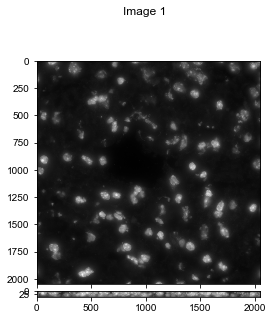

2021-12-28 23:39:27,552 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:39:27,552 [INFO] >>>> using GPU
2021-12-28 23:39:27,709 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:39:27,709 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:39:29,162 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:39:45,553 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.44it/s]
2021-12-28 23:39:46,209 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:39:51,921 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.81it/s]


2021-12-28 23:40:06,619 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.74it/s]


2021-12-28 23:40:09,413 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.64it/s]
2021-12-28 23:40:10,532 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:40:22,135 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.43it/s]


2021-12-28 23:40:33,901 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.33it/s]
2021-12-28 23:40:35,108 [INFO] network run in 66.71s
2021-12-28 23:40:54,663 [INFO] masks created in 19.56s
2021-12-28 23:40:58,930 [INFO] >>>> TOTAL TIME 91.22 sec
-- finish segmentation in 91.736s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_147_Segmentation.npy
-- removing segmentation_masks from class


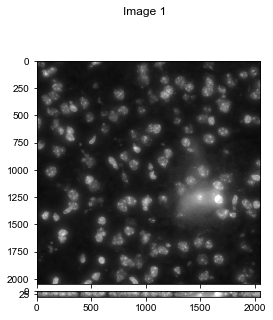

2021-12-28 23:41:11,722 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:41:11,722 [INFO] >>>> using GPU
2021-12-28 23:41:11,886 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:41:11,887 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:41:13,320 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:41:29,789 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.41it/s]
2021-12-28 23:41:30,461 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:41:36,164 [INFO] 98%|#########7| 79/81 [00:05<00:00, 14.58it/s]


2021-12-28 23:41:50,898 [INFO] 46%|####5     | 37/81 [00:02<00:03, 14.24it/s]


2021-12-28 23:41:53,952 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.30it/s]
2021-12-28 23:41:55,760 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:42:07,477 [INFO] 96%|#########6| 78/81 [00:05<00:00, 14.40it/s]


2021-12-28 23:42:19,666 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.34it/s]
2021-12-28 23:42:20,872 [INFO] network run in 68.35s
2021-12-28 23:42:46,446 [INFO] masks created in 25.57s
2021-12-28 23:42:50,712 [INFO] >>>> TOTAL TIME 98.83 sec
-- finish segmentation in 99.337s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_148_Segmentation.npy
-- removing segmentation_masks from class


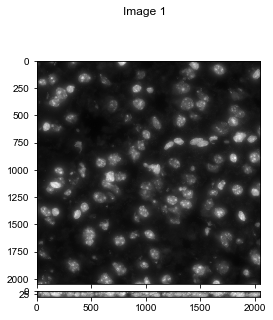

2021-12-28 23:43:03,642 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:43:03,642 [INFO] >>>> using GPU
2021-12-28 23:43:03,790 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:43:03,790 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:43:05,337 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:43:21,967 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.36it/s]
2021-12-28 23:43:22,666 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:43:28,406 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.56it/s]


2021-12-28 23:43:43,214 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.55it/s]


2021-12-28 23:43:46,058 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.36it/s]
2021-12-28 23:43:47,400 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:43:59,103 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.43it/s]


2021-12-28 23:44:11,006 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.29it/s]
2021-12-28 23:44:12,168 [INFO] network run in 67.66s
2021-12-28 23:44:37,464 [INFO] masks created in 25.30s
2021-12-28 23:44:41,854 [INFO] >>>> TOTAL TIME 98.06 sec
-- finish segmentation in 98.544s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_149_Segmentation.npy
-- removing segmentation_masks from class


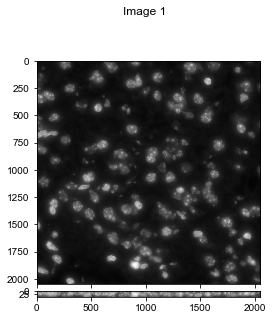

2021-12-28 23:44:55,323 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:44:55,323 [INFO] >>>> using GPU
2021-12-28 23:44:55,527 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:44:55,527 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:44:56,986 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:45:13,933 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.33it/s]
2021-12-28 23:45:14,636 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:45:20,477 [INFO] 99%|#########8| 80/81 [00:05<00:00, 13.90it/s]


2021-12-28 23:45:35,558 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.30it/s]


2021-12-28 23:45:38,464 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.17it/s]
2021-12-28 23:45:40,011 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:45:51,814 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.36it/s]


2021-12-28 23:46:03,988 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.84it/s]
2021-12-28 23:46:05,230 [INFO] network run in 69.00s
2021-12-28 23:46:31,840 [INFO] masks created in 26.61s
2021-12-28 23:46:36,465 [INFO] >>>> TOTAL TIME 100.94 sec
-- finish segmentation in 101.517s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_150_Segmentation.npy
-- removing segmentation_masks from class


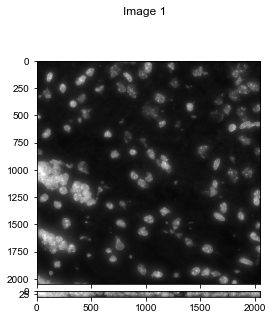

2021-12-28 23:46:49,997 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:46:49,997 [INFO] >>>> using GPU
2021-12-28 23:46:50,184 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:46:50,184 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:46:51,731 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:47:08,899 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.29it/s]
2021-12-28 23:47:09,638 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:47:15,544 [INFO] 99%|#########8| 80/81 [00:05<00:00, 13.94it/s]


2021-12-28 23:47:30,841 [INFO] 48%|####8     | 39/81 [00:02<00:02, 14.05it/s]


2021-12-28 23:47:33,763 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.04it/s]
2021-12-28 23:47:35,592 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:47:47,515 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.21it/s]


2021-12-28 23:47:59,389 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.42it/s]
2021-12-28 23:48:00,566 [INFO] network run in 69.62s
2021-12-28 23:48:24,179 [INFO] masks created in 23.61s
2021-12-28 23:48:28,811 [INFO] >>>> TOTAL TIME 98.63 sec
-- finish segmentation in 99.158s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_151_Segmentation.npy
-- removing segmentation_masks from class


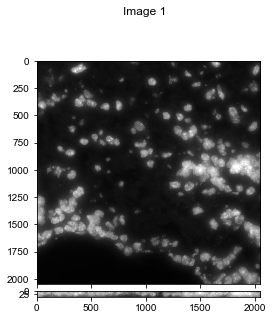

2021-12-28 23:48:42,835 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:48:42,835 [INFO] >>>> using GPU
2021-12-28 23:48:43,000 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:48:43,000 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:48:44,642 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:49:01,579 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.29it/s]
2021-12-28 23:49:02,315 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:49:08,140 [INFO] 98%|#########7| 79/81 [00:05<00:00, 14.31it/s]


2021-12-28 23:49:23,634 [INFO] 47%|####6     | 38/81 [00:02<00:03, 13.96it/s]


2021-12-28 23:49:26,704 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.95it/s]
2021-12-28 23:49:28,690 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:49:40,653 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.10it/s]


2021-12-28 23:49:52,831 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.07it/s]
2021-12-28 23:49:54,125 [INFO] network run in 70.23s
2021-12-28 23:50:20,118 [INFO] masks created in 25.99s
2021-12-28 23:50:24,922 [INFO] >>>> TOTAL TIME 101.92 sec
-- finish segmentation in 102.463s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_152_Segmentation.npy
-- removing segmentation_masks from class


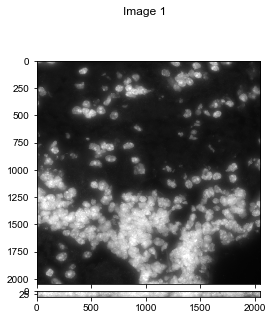

2021-12-28 23:50:39,485 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:50:39,485 [INFO] >>>> using GPU
2021-12-28 23:50:39,688 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:50:39,688 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:50:41,438 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:50:58,673 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.32it/s]
2021-12-28 23:50:59,391 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:51:05,360 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.19it/s]


2021-12-28 23:51:20,751 [INFO] 49%|####9     | 40/81 [00:02<00:03, 13.66it/s]


2021-12-28 23:51:23,689 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.90it/s]
2021-12-28 23:51:25,610 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:51:37,736 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.08it/s]


2021-12-28 23:51:49,941 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.04it/s]
2021-12-28 23:51:51,283 [INFO] network run in 70.83s
2021-12-28 23:52:17,513 [INFO] masks created in 26.23s
2021-12-28 23:52:22,267 [INFO] >>>> TOTAL TIME 102.58 sec
-- finish segmentation in 103.179s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_153_Segmentation.npy
-- removing segmentation_masks from class


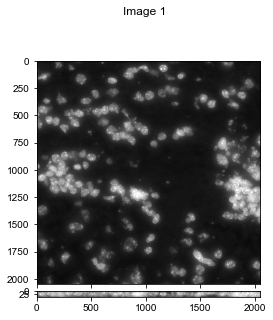

2021-12-28 23:52:36,636 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:52:36,637 [INFO] >>>> using GPU
2021-12-28 23:52:36,824 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:52:36,824 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:52:38,490 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:52:55,573 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.31it/s]
2021-12-28 23:52:56,385 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:53:02,319 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.12it/s]


2021-12-28 23:53:17,784 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.23it/s]


2021-12-28 23:53:20,684 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.03it/s]
2021-12-28 23:53:22,566 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:53:34,705 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.86it/s]


2021-12-28 23:53:46,996 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.95it/s]
2021-12-28 23:53:48,269 [INFO] network run in 70.61s
2021-12-28 23:54:14,800 [INFO] masks created in 26.53s
2021-12-28 23:54:19,746 [INFO] >>>> TOTAL TIME 102.92 sec
-- finish segmentation in 103.479s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_154_Segmentation.npy
-- removing segmentation_masks from class


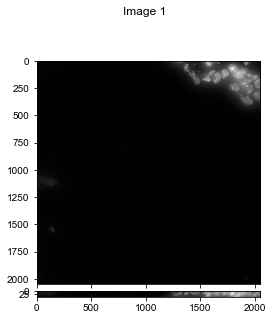

2021-12-28 23:54:34,346 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:54:34,346 [INFO] >>>> using GPU
2021-12-28 23:54:34,551 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:54:34,566 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:54:36,301 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:54:53,490 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.30it/s]
2021-12-28 23:54:54,266 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:55:00,201 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.26it/s]


2021-12-28 23:55:15,621 [INFO] 49%|####9     | 40/81 [00:02<00:02, 13.92it/s]


2021-12-28 23:55:18,536 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.90it/s]
2021-12-28 23:55:20,411 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:55:32,395 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.09it/s]


2021-12-28 23:55:44,739 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.90it/s]
2021-12-28 23:55:46,049 [INFO] network run in 70.62s
2021-12-28 23:56:02,180 [INFO] masks created in 16.13s
2021-12-28 23:56:07,444 [INFO] >>>> TOTAL TIME 92.89 sec
-- finish segmentation in 93.510s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_155_Segmentation.npy
-- removing segmentation_masks from class


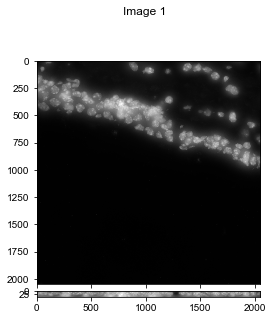

2021-12-28 23:56:21,978 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:56:21,979 [INFO] >>>> using GPU
2021-12-28 23:56:22,177 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:56:22,177 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:56:23,881 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:56:41,077 [INFO] 100%|##########| 13/13 [00:04<00:00,  3.22it/s]
2021-12-28 23:56:41,882 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:56:47,975 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.54it/s]


2021-12-28 23:57:03,625 [INFO] 49%|####9     | 40/81 [00:02<00:02, 13.77it/s]


2021-12-28 23:57:06,553 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.86it/s]
2021-12-28 23:57:08,491 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:57:20,710 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.82it/s]


2021-12-28 23:57:33,133 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.76it/s]
2021-12-28 23:57:34,432 [INFO] network run in 71.33s
2021-12-28 23:57:53,999 [INFO] masks created in 19.57s
2021-12-28 23:57:58,951 [INFO] >>>> TOTAL TIME 96.77 sec
-- finish segmentation in 97.374s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_156_Segmentation.npy
-- removing segmentation_masks from class


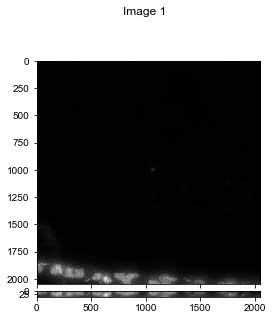

2021-12-28 23:58:13,731 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:58:13,732 [INFO] >>>> using GPU
2021-12-28 23:58:13,914 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:58:13,914 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-28 23:58:15,422 [INFO] running YX: 50 planes of size (884, 884)
2021-12-28 23:58:32,570 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.32it/s]
2021-12-28 23:58:33,332 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-28 23:58:39,263 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.12it/s]


2021-12-28 23:58:54,680 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.17it/s]


2021-12-28 23:58:57,586 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.05it/s]
2021-12-28 23:58:59,445 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-28 23:59:11,540 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.28it/s]


2021-12-28 23:59:23,856 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.85it/s]
2021-12-28 23:59:25,134 [INFO] network run in 70.44s
2021-12-28 23:59:40,353 [INFO] masks created in 15.20s
2021-12-28 23:59:45,263 [INFO] >>>> TOTAL TIME 91.35 sec
-- finish segmentation in 91.900s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_157_Segmentation.npy
-- removing segmentation_masks from class


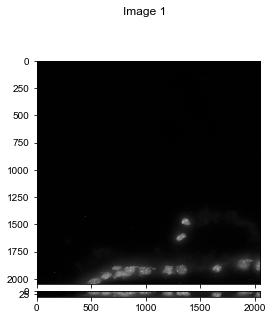

2021-12-28 23:59:59,404 [INFO] ** TORCH CUDA version installed and working. **
2021-12-28 23:59:59,405 [INFO] >>>> using GPU
2021-12-28 23:59:59,603 [INFO] ~~~ FINDING MASKS ~~~
2021-12-28 23:59:59,603 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:00:01,415 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:00:18,525 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.32it/s]
2021-12-29 00:00:19,323 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:00:25,294 [INFO] 99%|#########8| 80/81 [00:05<00:00, 13.89it/s]


2021-12-29 00:00:40,759 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.15it/s]


2021-12-29 00:00:43,665 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.01it/s]
2021-12-29 00:00:45,683 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:00:57,901 [INFO] 99%|#########8| 80/81 [00:05<00:00, 13.90it/s]


2021-12-29 00:01:10,508 [INFO] 100%|##########| 81/81 [00:06<00:00, 13.39it/s]
2021-12-29 00:01:11,791 [INFO] network run in 71.24s
2021-12-29 00:01:27,134 [INFO] masks created in 15.34s
2021-12-29 00:01:32,042 [INFO] >>>> TOTAL TIME 92.44 sec
-- finish segmentation in 93.029s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_158_Segmentation.npy
-- removing segmentation_masks from class


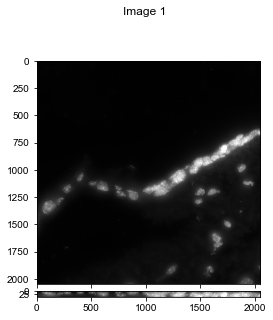

2021-12-29 00:01:46,565 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:01:46,566 [INFO] >>>> using GPU
2021-12-29 00:01:46,760 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:01:46,760 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:01:48,462 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:02:05,558 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.29it/s]
2021-12-29 00:02:06,386 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:02:12,324 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.27it/s]


2021-12-29 00:02:27,753 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.30it/s]


2021-12-29 00:02:30,679 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.86it/s]
2021-12-29 00:02:32,641 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:02:44,996 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.69it/s]


2021-12-29 00:02:57,357 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.75it/s]
2021-12-29 00:02:58,730 [INFO] network run in 71.12s
2021-12-29 00:03:16,262 [INFO] masks created in 17.53s
2021-12-29 00:03:21,515 [INFO] >>>> TOTAL TIME 94.75 sec
-- finish segmentation in 95.356s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_159_Segmentation.npy
-- removing segmentation_masks from class


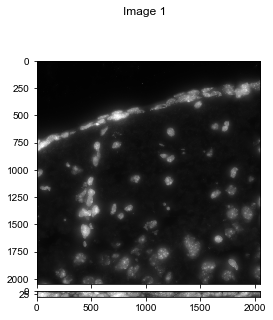

2021-12-29 00:03:37,022 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:03:37,023 [INFO] >>>> using GPU
2021-12-29 00:03:37,239 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:03:37,240 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:03:39,190 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:03:56,716 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.30it/s]
2021-12-29 00:03:57,528 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:04:03,638 [INFO] 99%|#########8| 80/81 [00:05<00:00, 13.75it/s]


2021-12-29 00:04:19,169 [INFO] 49%|####9     | 40/81 [00:02<00:03, 13.43it/s]


2021-12-29 00:04:22,154 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.71it/s]
2021-12-29 00:04:24,179 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:04:36,405 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.84it/s]


2021-12-29 00:04:48,842 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.79it/s]
2021-12-29 00:04:50,232 [INFO] network run in 71.96s
2021-12-29 00:05:12,670 [INFO] masks created in 22.44s
2021-12-29 00:05:17,828 [INFO] >>>> TOTAL TIME 100.59 sec
-- finish segmentation in 101.197s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_160_Segmentation.npy
-- removing segmentation_masks from class


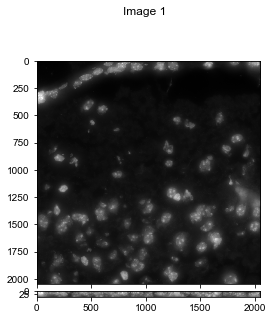

2021-12-29 00:05:32,720 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:05:32,721 [INFO] >>>> using GPU
2021-12-29 00:05:32,905 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:05:32,905 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:05:34,610 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:05:51,671 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.32it/s]
2021-12-29 00:05:52,452 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:05:58,362 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.17it/s]


2021-12-29 00:06:13,874 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.09it/s]


2021-12-29 00:06:16,798 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.97it/s]
2021-12-29 00:06:18,718 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:06:30,961 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.73it/s]


2021-12-29 00:06:43,125 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.98it/s]
2021-12-29 00:06:44,335 [INFO] network run in 70.52s
2021-12-29 00:07:04,618 [INFO] masks created in 20.28s
2021-12-29 00:07:08,922 [INFO] >>>> TOTAL TIME 96.02 sec
-- finish segmentation in 96.547s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_161_Segmentation.npy
-- removing segmentation_masks from class


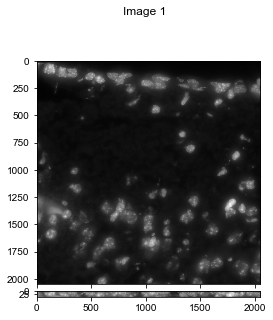

2021-12-29 00:07:22,234 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:07:22,234 [INFO] >>>> using GPU
2021-12-29 00:07:22,406 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:07:22,406 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:07:23,812 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:07:40,767 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.37it/s]
2021-12-29 00:07:41,485 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:07:47,328 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.19it/s]


2021-12-29 00:08:02,490 [INFO] 47%|####6     | 38/81 [00:02<00:03, 14.11it/s]


2021-12-29 00:08:05,501 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.12it/s]
2021-12-29 00:08:07,001 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:08:18,957 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.31it/s]


2021-12-29 00:08:31,050 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.20it/s]
2021-12-29 00:08:32,282 [INFO] network run in 69.17s
2021-12-29 00:08:52,819 [INFO] masks created in 20.54s
2021-12-29 00:08:57,209 [INFO] >>>> TOTAL TIME 94.80 sec
-- finish segmentation in 95.330s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_162_Segmentation.npy
-- removing segmentation_masks from class


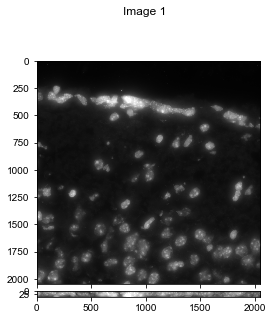

2021-12-29 00:09:10,330 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:09:10,330 [INFO] >>>> using GPU
2021-12-29 00:09:10,517 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:09:10,517 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:09:12,189 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:09:29,158 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.38it/s]
2021-12-29 00:09:29,924 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:09:35,877 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.34it/s]


2021-12-29 00:09:51,299 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.07it/s]


2021-12-29 00:09:54,267 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.75it/s]
2021-12-29 00:09:56,221 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:10:08,409 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.70it/s]


2021-12-29 00:10:20,690 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.71it/s]
2021-12-29 00:10:21,987 [INFO] network run in 70.75s
2021-12-29 00:10:47,472 [INFO] masks created in 25.48s
2021-12-29 00:10:52,477 [INFO] >>>> TOTAL TIME 101.96 sec
-- finish segmentation in 102.549s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_163_Segmentation.npy
-- removing segmentation_masks from class


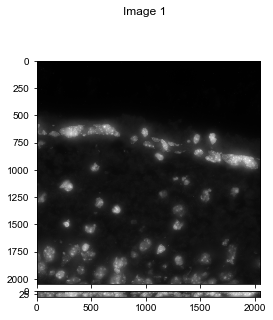

2021-12-29 00:11:06,769 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:11:06,769 [INFO] >>>> using GPU
2021-12-29 00:11:06,965 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:11:06,966 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:11:08,798 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:11:25,504 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.40it/s]
2021-12-29 00:11:26,144 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:11:31,879 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.36it/s]


2021-12-29 00:11:46,613 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.45it/s]


2021-12-29 00:11:49,442 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.48it/s]
2021-12-29 00:11:50,629 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:12:02,224 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.48it/s]


2021-12-29 00:12:14,100 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.35it/s]
2021-12-29 00:12:15,208 [INFO] network run in 67.28s
2021-12-29 00:12:32,052 [INFO] masks created in 16.84s
2021-12-29 00:12:36,272 [INFO] >>>> TOTAL TIME 89.31 sec
-- finish segmentation in 89.861s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_164_Segmentation.npy
-- removing segmentation_masks from class


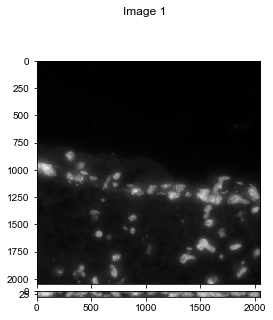

2021-12-29 00:12:48,475 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:12:48,476 [INFO] >>>> using GPU
2021-12-29 00:12:48,614 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:12:48,614 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:12:49,864 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:13:06,380 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.42it/s]
2021-12-29 00:13:07,052 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:13:12,771 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.91it/s]


2021-12-29 00:13:27,506 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.92it/s]


2021-12-29 00:13:30,365 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.44it/s]
2021-12-29 00:13:31,943 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:13:43,693 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.28it/s]


2021-12-29 00:13:55,538 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.36it/s]
2021-12-29 00:13:56,725 [INFO] network run in 67.52s
2021-12-29 00:14:11,678 [INFO] masks created in 14.95s
2021-12-29 00:14:15,944 [INFO] >>>> TOTAL TIME 87.33 sec
-- finish segmentation in 87.814s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_165_Segmentation.npy
-- removing segmentation_masks from class


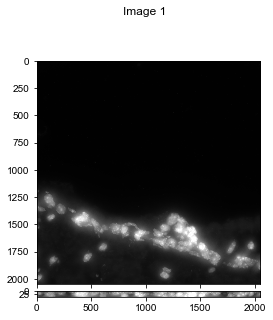

2021-12-29 00:14:28,588 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:14:28,588 [INFO] >>>> using GPU
2021-12-29 00:14:28,756 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:14:28,756 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:14:30,131 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:14:46,616 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.42it/s]
2021-12-29 00:14:47,319 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:14:53,038 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.64it/s]


2021-12-29 00:15:07,867 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.75it/s]


2021-12-29 00:15:10,695 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.48it/s]
2021-12-29 00:15:12,118 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:15:23,851 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.34it/s]


2021-12-29 00:15:35,715 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.40it/s]
2021-12-29 00:15:36,883 [INFO] network run in 67.41s
2021-12-29 00:15:53,023 [INFO] masks created in 16.14s
2021-12-29 00:15:57,805 [INFO] >>>> TOTAL TIME 89.05 sec
-- finish segmentation in 89.576s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_166_Segmentation.npy
-- removing segmentation_masks from class


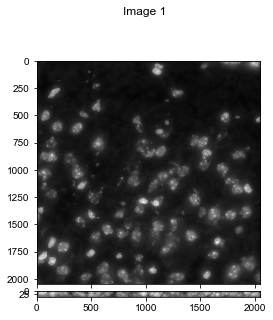

2021-12-29 00:16:11,383 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:16:11,383 [INFO] >>>> using GPU
2021-12-29 00:16:11,586 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:16:11,586 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:16:13,118 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:16:30,071 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.36it/s]
2021-12-29 00:16:30,832 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:16:36,698 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.40it/s]


2021-12-29 00:16:51,712 [INFO] 47%|####6     | 38/81 [00:02<00:03, 14.17it/s]


2021-12-29 00:16:54,743 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.13it/s]
2021-12-29 00:16:56,579 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:17:08,837 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.12it/s]


2021-12-29 00:17:21,245 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.86it/s]
2021-12-29 00:17:22,501 [INFO] network run in 70.10s
2021-12-29 00:17:47,288 [INFO] masks created in 24.79s
2021-12-29 00:17:52,160 [INFO] >>>> TOTAL TIME 100.57 sec
-- finish segmentation in 101.153s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_167_Segmentation.npy
-- removing segmentation_masks from class


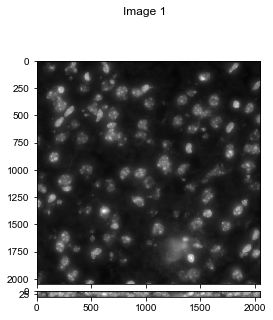

2021-12-29 00:18:06,672 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:18:06,673 [INFO] >>>> using GPU
2021-12-29 00:18:06,854 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:18:06,854 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:18:08,433 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:18:25,625 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.26it/s]
2021-12-29 00:18:26,433 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:18:32,485 [INFO] 99%|#########8| 80/81 [00:05<00:00, 13.55it/s]


2021-12-29 00:18:47,995 [INFO] 48%|####8     | 39/81 [00:02<00:03, 13.92it/s]


2021-12-29 00:18:50,995 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.90it/s]
2021-12-29 00:18:53,042 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:19:05,351 [INFO] 99%|#########8| 80/81 [00:05<00:00, 13.53it/s]


2021-12-29 00:19:17,792 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.82it/s]
2021-12-29 00:19:19,120 [INFO] network run in 71.51s
2021-12-29 00:19:46,840 [INFO] masks created in 27.72s
2021-12-29 00:19:51,663 [INFO] >>>> TOTAL TIME 104.81 sec
-- finish segmentation in 105.358s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_168_Segmentation.npy
-- removing segmentation_masks from class


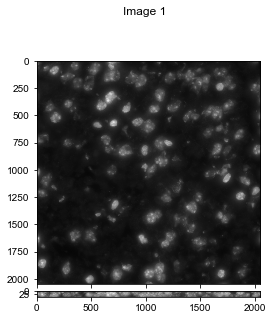

2021-12-29 00:20:06,341 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:20:06,341 [INFO] >>>> using GPU
2021-12-29 00:20:06,527 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:20:06,527 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:20:08,137 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:20:25,309 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.27it/s]
2021-12-29 00:20:26,074 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:20:31,996 [INFO] 99%|#########8| 80/81 [00:05<00:00, 13.96it/s]


2021-12-29 00:20:47,247 [INFO] 47%|####6     | 38/81 [00:02<00:03, 14.12it/s]


2021-12-29 00:20:50,325 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.01it/s]
2021-12-29 00:20:52,278 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:21:04,358 [INFO] 99%|#########8| 80/81 [00:05<00:00, 13.62it/s]


2021-12-29 00:21:16,858 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.78it/s]
2021-12-29 00:21:18,124 [INFO] network run in 70.77s
2021-12-29 00:21:44,342 [INFO] masks created in 26.20s
2021-12-29 00:21:49,342 [INFO] >>>> TOTAL TIME 102.81 sec
-- finish segmentation in 103.360s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_169_Segmentation.npy
-- removing segmentation_masks from class


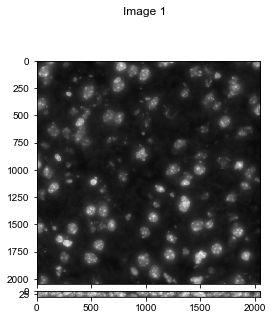

2021-12-29 00:22:04,249 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:22:04,250 [INFO] >>>> using GPU
2021-12-29 00:22:04,436 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:22:04,436 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:22:05,996 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:22:23,217 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.28it/s]
2021-12-29 00:22:23,977 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:22:29,913 [INFO] 98%|#########7| 79/81 [00:05<00:00, 13.43it/s]


2021-12-29 00:22:45,227 [INFO] 47%|####6     | 38/81 [00:02<00:03, 14.06it/s]


2021-12-29 00:22:48,295 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.99it/s]
2021-12-29 00:22:50,202 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:23:02,202 [INFO] 98%|#########7| 79/81 [00:05<00:00, 14.21it/s]


2021-12-29 00:23:14,763 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.94it/s]
2021-12-29 00:23:15,952 [INFO] network run in 70.69s
2021-12-29 00:23:43,548 [INFO] masks created in 27.60s
2021-12-29 00:23:48,531 [INFO] >>>> TOTAL TIME 104.10 sec
-- finish segmentation in 104.723s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_170_Segmentation.npy
-- removing segmentation_masks from class


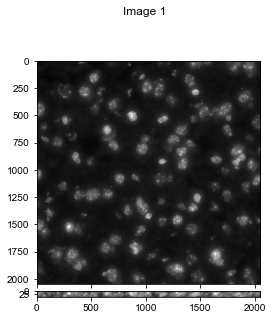

2021-12-29 00:24:03,263 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:24:03,263 [INFO] >>>> using GPU
2021-12-29 00:24:03,461 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:24:03,461 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:24:05,156 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:24:22,312 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.29it/s]
2021-12-29 00:24:23,141 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:24:29,134 [INFO] 99%|#########8| 80/81 [00:05<00:00, 13.66it/s]


2021-12-29 00:24:44,493 [INFO] 49%|####9     | 40/81 [00:02<00:03, 13.07it/s]


2021-12-29 00:24:47,422 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.86it/s]
2021-12-29 00:24:49,422 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:25:01,657 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.11it/s]


2021-12-29 00:25:14,045 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.65it/s]
2021-12-29 00:25:15,404 [INFO] network run in 71.06s
2021-12-29 00:25:43,598 [INFO] masks created in 28.19s
2021-12-29 00:25:48,576 [INFO] >>>> TOTAL TIME 105.12 sec
-- finish segmentation in 105.695s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_171_Segmentation.npy
-- removing segmentation_masks from class


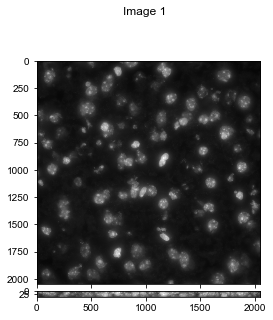

2021-12-29 00:26:03,923 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:26:03,923 [INFO] >>>> using GPU
2021-12-29 00:26:04,158 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:26:04,158 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:26:05,916 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:26:23,002 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.31it/s]
2021-12-29 00:26:23,868 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:26:29,799 [INFO] 98%|#########7| 79/81 [00:05<00:00, 14.35it/s]


2021-12-29 00:26:45,112 [INFO] 46%|####5     | 37/81 [00:02<00:03, 14.05it/s]


2021-12-29 00:26:48,237 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.00it/s]
2021-12-29 00:26:50,033 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:27:02,034 [INFO] 96%|#########6| 78/81 [00:05<00:00, 14.14it/s]


2021-12-29 00:27:14,503 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.90it/s]
2021-12-29 00:27:15,806 [INFO] network run in 70.79s
2021-12-29 00:27:43,222 [INFO] masks created in 27.41s
2021-12-29 00:27:47,983 [INFO] >>>> TOTAL TIME 103.83 sec
-- finish segmentation in 104.445s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_172_Segmentation.npy
-- removing segmentation_masks from class


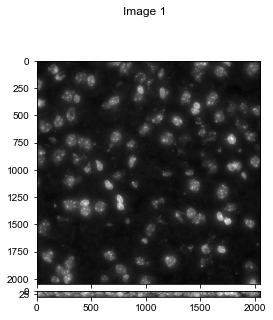

2021-12-29 00:28:02,372 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:28:02,373 [INFO] >>>> using GPU
2021-12-29 00:28:02,598 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:28:02,598 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:28:04,364 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:28:21,643 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.26it/s]
2021-12-29 00:28:22,426 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:28:28,426 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.20it/s]


2021-12-29 00:28:43,943 [INFO] 49%|####9     | 40/81 [00:02<00:02, 13.89it/s]


2021-12-29 00:28:46,911 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.86it/s]
2021-12-29 00:28:48,801 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:29:01,021 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.79it/s]


2021-12-29 00:29:13,457 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.72it/s]
2021-12-29 00:29:14,864 [INFO] network run in 71.39s
2021-12-29 00:29:42,521 [INFO] masks created in 27.66s
2021-12-29 00:29:47,446 [INFO] >>>> TOTAL TIME 104.85 sec
-- finish segmentation in 105.464s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_173_Segmentation.npy
-- removing segmentation_masks from class


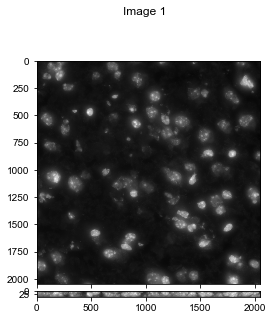

2021-12-29 00:30:03,349 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:30:03,365 [INFO] >>>> using GPU
2021-12-29 00:30:03,568 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:30:03,568 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:30:05,373 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:30:22,740 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.26it/s]
2021-12-29 00:30:23,568 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:30:29,667 [INFO] 99%|#########8| 80/81 [00:05<00:00, 13.83it/s]


2021-12-29 00:30:45,225 [INFO] 47%|####6     | 38/81 [00:02<00:03, 13.71it/s]


2021-12-29 00:30:48,303 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.86it/s]
2021-12-29 00:30:50,428 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:31:02,649 [INFO] 99%|#########8| 80/81 [00:05<00:00, 13.86it/s]


2021-12-29 00:31:15,240 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.79it/s]
2021-12-29 00:31:16,553 [INFO] network run in 72.04s
2021-12-29 00:31:41,679 [INFO] masks created in 25.13s
2021-12-29 00:31:46,428 [INFO] >>>> TOTAL TIME 102.86 sec
-- finish segmentation in 103.497s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_174_Segmentation.npy
-- removing segmentation_masks from class


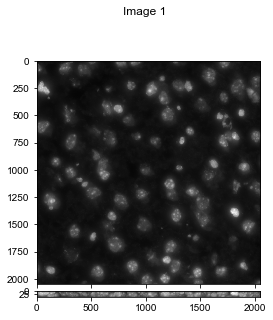

2021-12-29 00:32:01,303 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:32:01,303 [INFO] >>>> using GPU
2021-12-29 00:32:01,522 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:32:01,522 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:32:03,272 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:32:20,304 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.29it/s]
2021-12-29 00:32:21,065 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:32:27,013 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.00it/s]


2021-12-29 00:32:42,413 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.37it/s]


2021-12-29 00:32:45,366 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.01it/s]
2021-12-29 00:32:47,257 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:32:59,366 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.94it/s]


2021-12-29 00:33:11,589 [INFO] 100%|##########| 81/81 [00:05<00:00, 14.08it/s]
2021-12-29 00:33:12,940 [INFO] network run in 70.68s
2021-12-29 00:33:41,224 [INFO] masks created in 28.28s
2021-12-29 00:33:46,004 [INFO] >>>> TOTAL TIME 104.48 sec
-- finish segmentation in 105.081s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_175_Segmentation.npy
-- removing segmentation_masks from class


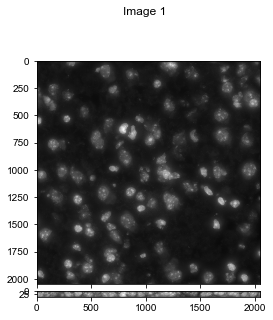

2021-12-29 00:34:00,751 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:34:00,751 [INFO] >>>> using GPU
2021-12-29 00:34:00,936 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:34:00,936 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:34:02,761 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:34:19,775 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.32it/s]
2021-12-29 00:34:20,509 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:34:26,442 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.19it/s]


2021-12-29 00:34:41,750 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.11it/s]


2021-12-29 00:34:44,664 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.97it/s]
2021-12-29 00:34:46,570 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:34:58,591 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.87it/s]


2021-12-29 00:35:10,914 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.81it/s]
2021-12-29 00:35:12,158 [INFO] network run in 70.38s
2021-12-29 00:35:39,773 [INFO] masks created in 27.62s
2021-12-29 00:35:44,603 [INFO] >>>> TOTAL TIME 103.67 sec
-- finish segmentation in 104.254s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_176_Segmentation.npy
-- removing segmentation_masks from class


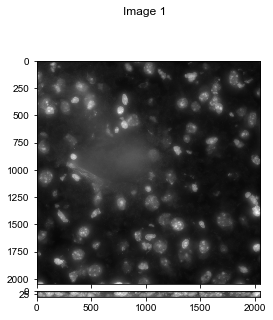

2021-12-29 00:35:59,342 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:35:59,342 [INFO] >>>> using GPU
2021-12-29 00:35:59,507 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:35:59,507 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:36:01,214 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:36:18,443 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.28it/s]
2021-12-29 00:36:19,193 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:36:25,163 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.09it/s]


2021-12-29 00:36:40,786 [INFO] 49%|####9     | 40/81 [00:02<00:02, 13.99it/s]


2021-12-29 00:36:43,801 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.62it/s]
2021-12-29 00:36:45,685 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:36:57,950 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.74it/s]


2021-12-29 00:37:10,241 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.94it/s]
2021-12-29 00:37:11,533 [INFO] network run in 71.13s
2021-12-29 00:37:38,347 [INFO] masks created in 26.81s
2021-12-29 00:37:43,423 [INFO] >>>> TOTAL TIME 103.92 sec
-- finish segmentation in 104.448s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_177_Segmentation.npy
-- removing segmentation_masks from class


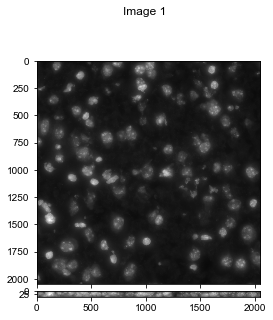

2021-12-29 00:37:58,818 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:37:58,818 [INFO] >>>> using GPU
2021-12-29 00:37:59,001 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:37:59,001 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:38:00,856 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:38:18,233 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.27it/s]
2021-12-29 00:38:19,034 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:38:25,031 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.05it/s]


2021-12-29 00:38:40,579 [INFO] 49%|####9     | 40/81 [00:02<00:02, 13.93it/s]


2021-12-29 00:38:43,537 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.86it/s]
2021-12-29 00:38:45,488 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:38:57,656 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.89it/s]


2021-12-29 00:39:10,087 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.67it/s]
2021-12-29 00:39:11,482 [INFO] network run in 71.54s
2021-12-29 00:39:40,444 [INFO] masks created in 28.96s
2021-12-29 00:39:45,429 [INFO] >>>> TOTAL TIME 106.43 sec
-- finish segmentation in 106.988s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_178_Segmentation.npy
-- removing segmentation_masks from class


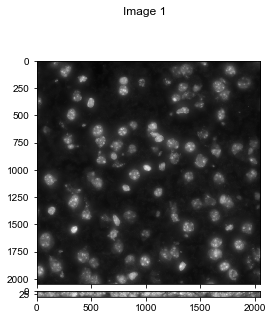

2021-12-29 00:40:00,642 [INFO] ** TORCH CUDA version installed and working. **
2021-12-29 00:40:00,642 [INFO] >>>> using GPU
2021-12-29 00:40:00,842 [INFO] ~~~ FINDING MASKS ~~~
2021-12-29 00:40:00,842 [INFO] multi-stack tiff read in as having 50 planes 2 channels
2021-12-29 00:40:02,466 [INFO] running YX: 50 planes of size (884, 884)
2021-12-29 00:40:19,638 [INFO] 100%|##########| 13/13 [00:03<00:00,  3.31it/s]
2021-12-29 00:40:20,453 [INFO] running ZY: 884 planes of size (50, 884)
2021-12-29 00:40:26,444 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.32it/s]


2021-12-29 00:40:42,028 [INFO] 49%|####9     | 40/81 [00:02<00:02, 14.15it/s]


2021-12-29 00:40:44,948 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.95it/s]
2021-12-29 00:40:46,930 [INFO] running ZX: 884 planes of size (50, 884)
2021-12-29 00:40:59,062 [INFO] 99%|#########8| 80/81 [00:05<00:00, 14.03it/s]


2021-12-29 00:41:11,395 [INFO] 100%|##########| 81/81 [00:05<00:00, 13.95it/s]
2021-12-29 00:41:12,733 [INFO] network run in 71.06s
2021-12-29 00:41:41,677 [INFO] masks created in 28.94s
2021-12-29 00:41:46,580 [INFO] >>>> TOTAL TIME 105.74 sec
-- finish segmentation in 106.310s. 
-- saving mask into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Segmentation\Conv_zscan_179_Segmentation.npy
-- removing segmentation_masks from class


In [7]:
%matplotlib inline
for _filename in save_filenames:
    
    with h5py.File(_filename, "r", libver='latest') as _f:
        
        fov_id = _f.attrs['fov_id']
        
        polyt_im = _f['protein']['ims'][0]
        dapi_im = _f.attrs['dapi_im']
        
        parameters = ast.literal_eval(_f.attrs['shared_parameters']) 
        rna_spots_list = [_spots[_spots[:,0]>0] for _spots in _f['rna']['spots'][:]]
        rna_channels = [_ch.decode() for _ch in _f['rna']['channels'][:]]
        
    pixel_sizes = parameters['distance_zxy']
    single_im_size = parameters['single_im_size']

    segmentation_filename = os.path.join(segmentation_folder, 
                                         os.path.basename(_filename).replace('.hdf5', '_Segmentation.npy') )
    gene_count_filename = os.path.join(gene_count_folder, 
                                         os.path.basename(_filename).replace('.hdf5', '_GeneCounts.csv') )
    cell_location_filename = os.path.join(cell_location_folder, 
                                          os.path.basename(_filename).replace('.hdf5', '_CellLocations.csv') )
    
    visual_tools.imshow_mark_3d_v2([dapi_im])
    seg_class = ia.segmentation_tools.cell.Cellpose_Segmentation_3D(dapi_im, polyt_im, pixel_sizes,
                                                                    save_filename=segmentation_filename,
                                                                    )

    _masks = seg_class.run()
    seg_class.save()
    seg_class.clear()
    #delattr(seg_class, 'segmentation_masks')
    #del(seg_class)

In [8]:
seg_class.clear()

-- removing segmentation_masks from class


In [9]:
# generate cell_location

import multiprocessing as mp

save_cell_location = True
overwrite = False
# prepare args
cell_location_args = []

processed_fovs = []

for _filename in save_filenames:
    
    with h5py.File(_filename, "r", libver='latest') as _f:
        
        fov_id = _f.attrs['fov_id']
        processed_fovs.append(fov_id)
        parameters = ast.literal_eval(_f.attrs['shared_parameters']) 
        
    pixel_sizes = parameters['distance_zxy']
    single_im_size = parameters['single_im_size']

    segmentation_filename = os.path.join(segmentation_folder, 
                                         os.path.basename(_filename).replace('.hdf5', '_Segmentation.npy') )
    
    cell_location_filename = os.path.join(cell_location_folder, 
                                          os.path.basename(_filename).replace('.hdf5', '_CellLocations.csv') )
    
    cell_location_args.append((segmentation_filename, fov_id, #np.array(fov_positions.iloc[fov_id]), 
                          single_im_size, pixel_sizes, 
                          save_cell_location, cell_location_filename, overwrite) )

In [10]:
%%time

from ImageAnalysis3.meta_tools import cell_locations
reload(ia.meta_tools.cell_locations)

with mp.Pool(6) as _meta_pool:
    print("Start")
    # Multi-proessing!
    _meta_pool.starmap(
        cell_locations.SegmentationMask3D_2_CellLocations,
        cell_location_args, 
        chunksize=1)
    # close multiprocessing
    _meta_pool.close()
    _meta_pool.join()
    _meta_pool.terminate()

Start
Wall time: 1h 15min 24s


In [11]:
cell_location_filenames = [os.path.join(cell_location_folder, _fl) for _fl in os.listdir(cell_location_folder)
                        if "_CellLocations.csv" in _fl]
print(len(cell_location_filenames))

180


In [12]:
import json
#microscope_filename = r'E:\Users\puzheng\Documents\Merfish_analysis\Merfish_Analysis_Scripts\merlin_parameters\microscope\storm6_microscope.json'
#microscope_info = #json.load(open(microscope_filename, 'r'))

# inverted flip h and v and trans

microscope_info = {'flip_horizontal': False, 'flip_vertical': True, 'transpose': False, 'microns_per_pixel': 0.108}
print(microscope_info)


{'flip_horizontal': False, 'flip_vertical': True, 'transpose': False, 'microns_per_pixel': 0.108}


In [13]:
from ImageAnalysis3.meta_tools.global_alignments import Load_PositionFile

fov_positions = Load_PositionFile(r'\\10.245.74.158\Chromatin_NAS_6\20211216-P_brain_CTP12-RNA\Experiments\positions_all.txt')
fov_positions

,x,y
0,-3983.5,-866.0
1,-3983.5,-666.0
2,-3783.5,-466.0
3,-3783.5,-666.0
4,-3783.5,-866.0
...,...,...
206,4104.9,-894.4
207,4104.9,-694.4
208,4104.9,-494.4
209,4104.9,-294.4


In [14]:
from ImageAnalysis3.meta_tools import cell_locations
reload(ia.meta_tools.cell_locations)

merged_cell_filename = os.path.join(cell_location_folder, f'merged_cell_locations_{min(processed_fovs)}-{max(processed_fovs)}.csv')
print(merged_cell_filename)
merged_cell_locations = cell_locations.Merge_CellLocations(cell_location_filenames, 
                                                           microscope_info,
                                                           fov_positions,
                                                           save=True, save_filename=merged_cell_filename,
                                                           overwrite=True,)

\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\CellLocations\merged_cell_locations_0-179.csv
- Start merging 180 cell locations
-- 20503 cells converted into MetaData
-- save 20503 cells into file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\CellLocations\merged_cell_locations_0-179.csv
-- merge cell-locations in 3.436s


In [15]:
cell_dfs = [pd.read_csv(_f) for _f in cell_location_filenames]

In [16]:
np.array([len(_df) for _df in cell_dfs])

array([ 39,  54, 148, 134, 222, 176, 115, 142, 124, 134, 144, 172, 130,
       153, 142, 152, 129, 110, 122, 123, 160, 143, 111, 115, 143, 105,
       114, 125, 131, 118, 111, 145, 115, 116, 122, 112, 125, 106, 112,
       119, 128, 130, 139, 148, 138, 132, 117,  22,  45,  65,  93,  97,
        85,  78,  65,  49,  46,  31,  59,  34,  58,  92, 148, 150, 163,
       217, 199, 163, 163, 163, 173, 132, 150, 146, 155, 152, 131, 101,
       123, 118, 131, 128, 115, 111,  97, 120, 117, 117,  93, 144, 121,
       129, 110, 130,  89,  78,  80,  63,  54,  35,   7,  18,  26,  58,
        61,  79,  92, 117, 112, 102,  82,  52, 117, 129, 114, 133, 153,
       123, 105, 125, 110, 117, 114, 122,  99, 142, 119,  99, 125, 135,
       118, 117, 119, 127, 137, 139, 144, 133, 135, 119, 117, 135, 137,
       142, 156, 141, 113, 109, 154, 125, 148, 122, 163, 223, 152,  35,
        93,  22,  22,  41,  92,  90, 102, 122,  79,  52,  53, 110, 141,
       124, 118, 124, 111, 107,  98, 107, 123, 123, 114, 115])

# generate gene counts

In [18]:
#reload(ia.meta_tools.partition_spots)
from ImageAnalysis3.meta_tools.partition_spots import Spots_Partition
gene_readout_filename = r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\CTP-12_mop_markers\CTP12-smFISH-RNA_gene-to-readouts.csv'

In [19]:
%matplotlib inline
fov_ids = []
gene_count_filenames = []
overwrite = False

for _filename in save_filenames:
    print(f"* {_filename}")
    with h5py.File(_filename, "r", libver='latest') as _f:
        
        fov_id = _f.attrs['fov_id']
        fov_ids.append(fov_id)
        
        polyt_im = _f['protein']['ims'][0]
        dapi_im = _f.attrs['dapi_im']
        
        parameters = ast.literal_eval(_f.attrs['shared_parameters']) 
        rna_spots_list = [_spots[_spots[:,0] > 0] for _spots in _f['rna']['spots'][:]]
        rna_channels = [_ch.decode() for _ch in _f['rna']['channels'][:]]
        rna_ids = [int(_id) for _id in _f['rna']['ids'][:]]
    
    
    #select rna_spots
    sel_rna_spots_list = [_spots[_spots[:,0] > channel_2_th[str(_ch)]] 
                          for _spots, _ch in zip(rna_spots_list, rna_channels)]
    
    pixel_sizes = parameters['distance_zxy']
    single_im_size = parameters['single_im_size']

    segmentation_filename = os.path.join(segmentation_folder, 
                                         os.path.basename(_filename).replace('.hdf5', '_Segmentation.npy') )
    gene_count_filename = os.path.join(gene_count_folder, 
                                         os.path.basename(_filename).replace('.hdf5', '_GeneCounts.csv') )
    gene_count_filenames.append(gene_count_filename)

    segmentation_masks = np.load(segmentation_filename)
    #visual_tools.imshow_mark_3d_v2([segmentation_masks])
    
    sp = Spots_Partition(segmentation_masks, gene_readout_filename, 
                         search_radius=10, pixel_sizes=pixel_sizes,
                         save_filename=gene_count_filename)
    sp.run(sel_rna_spots_list, bits=rna_ids,
           save=True, overwrite=overwrite)
    #del(segmentation_masks, sp)

* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_000.hdf5
- Partition spots
-- directly load from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_000_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_001.hdf5
- Partition spots
-- directly load from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_001_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_002.hdf5
- Partition spots
-- directly load from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_002_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_003.hdf5
- Partition spots
-- directly load from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_003_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_004.hdf5
- Partition spots
-- directly load from file: \\Franklin\SSD_01\P

- Partition spots
-- directly load from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_038_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_039.hdf5
- Partition spots
-- directly load from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_039_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_040.hdf5
- Partition spots
-- directly load from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_040_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_041.hdf5
- Partition spots
-- directly load from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_041_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_042.hdf5
- Partition spots
-- directly load from file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_042_GeneCounts.csv


- Partition spots
-- read gene_list
- partition barcodes for 8302 spots
- partition barcodes for 654 spots
- partition barcodes for 1376 spots
- partition barcodes for 4270 spots
- partition barcodes for 160 spots
- partition barcodes for 249 spots
- partition barcodes for 755 spots
- partition barcodes for 1322 spots
- partition barcodes for 95 spots
- partition barcodes for 257 spots
- partition barcodes for 110 spots
- partition barcodes for 1039 spots
- partition barcodes for 1813 spots
- partition barcodes for 10949 spots
- partition barcodes for 176 spots
- partition barcodes for 1110 spots
- partition barcodes for 4335 spots
- partition barcodes for 6247 spots
- partition barcodes for 7 spots
- partition barcodes for 3039 spots
- partition barcodes for 880 spots
- partition barcodes for 2366 spots
- partition barcodes for 403 spots
- partition barcodes for 606 spots
- partition barcodes for 110 spots
- partition barcodes for 1735 spots
- partition barcodes for 150 spots
- partit

- partition barcodes for 156 spots
- partition barcodes for 305 spots
-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_069_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_070.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 7220 spots
- partition barcodes for 1806 spots
- partition barcodes for 1239 spots
- partition barcodes for 5107 spots
- partition barcodes for 169 spots
- partition barcodes for 529 spots
- partition barcodes for 267 spots
- partition barcodes for 1888 spots
- partition barcodes for 116 spots
- partition barcodes for 292 spots
- partition barcodes for 99 spots
- partition barcodes for 1476 spots
- partition barcodes for 1560 spots
- partition barcodes for 11913 spots
- partition barcodes for 108 spots
- partition barcodes for 1260 spots
- partition barcodes for 2853 spots
- partition barcodes for 6299 spots
- partition barcodes for 2 spots
- partition barcod

- partition barcodes for 4596 spots
- partition barcodes for 4 spots
- partition barcodes for 1670 spots
- partition barcodes for 832 spots
- partition barcodes for 2035 spots
- partition barcodes for 315 spots
- partition barcodes for 430 spots
- partition barcodes for 92 spots
- partition barcodes for 793 spots
- partition barcodes for 108 spots
- partition barcodes for 377 spots
-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_076_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_077.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 9302 spots
- partition barcodes for 3430 spots
- partition barcodes for 722 spots
- partition barcodes for 2599 spots
- partition barcodes for 103 spots
- partition barcodes for 152 spots
- partition barcodes for 500 spots
- partition barcodes for 1677 spots
- partition barcodes for 108 spots
- partition barcodes for 168 spots
- partition barcodes fo

- partition barcodes for 82 spots
- partition barcodes for 134 spots
- partition barcodes for 695 spots
- partition barcodes for 6321 spots
- partition barcodes for 59 spots
- partition barcodes for 12118 spots
- partition barcodes for 111 spots
- partition barcodes for 787 spots
- partition barcodes for 7147 spots
- partition barcodes for 5289 spots
- partition barcodes for 5 spots
- partition barcodes for 1705 spots
- partition barcodes for 483 spots
- partition barcodes for 2031 spots
- partition barcodes for 513 spots
- partition barcodes for 462 spots
- partition barcodes for 107 spots
- partition barcodes for 581 spots
- partition barcodes for 92 spots
- partition barcodes for 311 spots
-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_083_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_084.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 6976 spots
- partition barcodes for

- Partition spots
-- read gene_list
- partition barcodes for 5631 spots
- partition barcodes for 4540 spots
- partition barcodes for 788 spots
- partition barcodes for 3556 spots
- partition barcodes for 195 spots
- partition barcodes for 375 spots
- partition barcodes for 436 spots
- partition barcodes for 1912 spots
- partition barcodes for 557 spots
- partition barcodes for 139 spots
- partition barcodes for 252 spots
- partition barcodes for 9438 spots
- partition barcodes for 82 spots
- partition barcodes for 11340 spots
- partition barcodes for 147 spots
- partition barcodes for 4438 spots
- partition barcodes for 3696 spots
- partition barcodes for 6545 spots
- partition barcodes for 4 spots
- partition barcodes for 1834 spots
- partition barcodes for 389 spots
- partition barcodes for 2022 spots
- partition barcodes for 172 spots
- partition barcodes for 303 spots
- partition barcodes for 119 spots
- partition barcodes for 262 spots
- partition barcodes for 96 spots
- partition

- partition barcodes for 135 spots
- partition barcodes for 310 spots
- partition barcodes for 117 spots
- partition barcodes for 839 spots
-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_096_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_097.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 155 spots
- partition barcodes for 268 spots
- partition barcodes for 136 spots
- partition barcodes for 846 spots
- partition barcodes for 81 spots
- partition barcodes for 80 spots
- partition barcodes for 11 spots
- partition barcodes for 80 spots
- partition barcodes for 9 spots
- partition barcodes for 108 spots
- partition barcodes for 71 spots
- partition barcodes for 883 spots
- partition barcodes for 5 spots
- partition barcodes for 1024 spots
- partition barcodes for 75 spots
- partition barcodes for 800 spots
- partition barcodes for 258 spots
- partition barcodes for 831 spots
-

- partition barcodes for 2 spots
- partition barcodes for 607 spots
- partition barcodes for 954 spots
- partition barcodes for 734 spots
- partition barcodes for 327 spots
- partition barcodes for 184 spots
- partition barcodes for 96 spots
- partition barcodes for 292 spots
- partition barcodes for 101 spots
- partition barcodes for 91 spots
-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_103_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_104.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 3520 spots
- partition barcodes for 2043 spots
- partition barcodes for 359 spots
- partition barcodes for 1431 spots
- partition barcodes for 111 spots
- partition barcodes for 232 spots
- partition barcodes for 214 spots
- partition barcodes for 293 spots
- partition barcodes for 68 spots
- partition barcodes for 126 spots
- partition barcodes for 107 spots
- partition barcodes for 4719

- partition barcodes for 7813 spots
- partition barcodes for 26 spots
- partition barcodes for 5969 spots
- partition barcodes for 91 spots
- partition barcodes for 3636 spots
- partition barcodes for 884 spots
- partition barcodes for 4404 spots
- partition barcodes for 3 spots
- partition barcodes for 933 spots
- partition barcodes for 541 spots
- partition barcodes for 1667 spots
- partition barcodes for 265 spots
- partition barcodes for 306 spots
- partition barcodes for 112 spots
- partition barcodes for 241 spots
- partition barcodes for 159 spots
- partition barcodes for 133 spots
-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_110_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_111.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 2213 spots
- partition barcodes for 765 spots
- partition barcodes for 127 spots
- partition barcodes for 643 spots
- partition barcodes for 

- partition barcodes for 5830 spots
- partition barcodes for 941 spots
- partition barcodes for 4024 spots
- partition barcodes for 345 spots
- partition barcodes for 462 spots
- partition barcodes for 106 spots
- partition barcodes for 1848 spots
- partition barcodes for 112 spots
- partition barcodes for 106 spots
- partition barcodes for 298 spots
- partition barcodes for 13063 spots
- partition barcodes for 47 spots
- partition barcodes for 11012 spots
- partition barcodes for 125 spots
- partition barcodes for 6274 spots
- partition barcodes for 2364 spots
- partition barcodes for 9278 spots
- partition barcodes for 2 spots
- partition barcodes for 619 spots
- partition barcodes for 758 spots
- partition barcodes for 2368 spots
- partition barcodes for 259 spots
- partition barcodes for 558 spots
- partition barcodes for 114 spots
- partition barcodes for 433 spots
- partition barcodes for 136 spots
- partition barcodes for 450 spots
-- save gene_count_df into file: \\Franklin\SSD

-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_123_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_124.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 13424 spots
- partition barcodes for 3443 spots
- partition barcodes for 936 spots
- partition barcodes for 3545 spots
- partition barcodes for 206 spots
- partition barcodes for 279 spots
- partition barcodes for 305 spots
- partition barcodes for 2126 spots
- partition barcodes for 110 spots
- partition barcodes for 120 spots
- partition barcodes for 644 spots
- partition barcodes for 5941 spots
- partition barcodes for 41 spots
- partition barcodes for 11155 spots
- partition barcodes for 131 spots
- partition barcodes for 889 spots
- partition barcodes for 6361 spots
- partition barcodes for 6005 spots
- partition barcodes for 4 spots
- partition barcodes for 1273 spots
- partition barcodes for 492 spots
- partition barcode

- partition barcodes for 6349 spots
- partition barcodes for 2 spots
- partition barcodes for 1998 spots
- partition barcodes for 717 spots
- partition barcodes for 2111 spots
- partition barcodes for 288 spots
- partition barcodes for 587 spots
- partition barcodes for 113 spots
- partition barcodes for 716 spots
- partition barcodes for 113 spots
- partition barcodes for 365 spots
-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_130_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_131.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 13104 spots
- partition barcodes for 4591 spots
- partition barcodes for 1146 spots
- partition barcodes for 4213 spots
- partition barcodes for 153 spots
- partition barcodes for 200 spots
- partition barcodes for 616 spots
- partition barcodes for 2010 spots
- partition barcodes for 217 spots
- partition barcodes for 180 spots
- partition barcodes

- partition barcodes for 543 spots
- partition barcodes for 87 spots
- partition barcodes for 141 spots
- partition barcodes for 1049 spots
- partition barcodes for 1639 spots
- partition barcodes for 8426 spots
- partition barcodes for 112 spots
- partition barcodes for 628 spots
- partition barcodes for 2197 spots
- partition barcodes for 5375 spots
- partition barcodes for 7 spots
- partition barcodes for 2783 spots
- partition barcodes for 605 spots
- partition barcodes for 1777 spots
- partition barcodes for 251 spots
- partition barcodes for 715 spots
- partition barcodes for 121 spots
- partition barcodes for 1157 spots
- partition barcodes for 121 spots
- partition barcodes for 459 spots
-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_137_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_138.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 11866 spots
- partition barcodes

- Partition spots
-- read gene_list
- partition barcodes for 12634 spots
- partition barcodes for 953 spots
- partition barcodes for 495 spots
- partition barcodes for 1985 spots
- partition barcodes for 200 spots
- partition barcodes for 196 spots
- partition barcodes for 70 spots
- partition barcodes for 1515 spots
- partition barcodes for 183 spots
- partition barcodes for 115 spots
- partition barcodes for 157 spots
- partition barcodes for 1613 spots
- partition barcodes for 1959 spots
- partition barcodes for 8954 spots
- partition barcodes for 93 spots
- partition barcodes for 628 spots
- partition barcodes for 2626 spots
- partition barcodes for 7496 spots
- partition barcodes for 4 spots
- partition barcodes for 2364 spots
- partition barcodes for 726 spots
- partition barcodes for 2052 spots
- partition barcodes for 497 spots
- partition barcodes for 428 spots
- partition barcodes for 93 spots
- partition barcodes for 1738 spots
- partition barcodes for 102 spots
- partition 

- partition barcodes for 156 spots
- partition barcodes for 485 spots
-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_150_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_151.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 2975 spots
- partition barcodes for 95 spots
- partition barcodes for 209 spots
- partition barcodes for 999 spots
- partition barcodes for 100 spots
- partition barcodes for 90 spots
- partition barcodes for 138 spots
- partition barcodes for 234 spots
- partition barcodes for 16 spots
- partition barcodes for 115 spots
- partition barcodes for 89 spots
- partition barcodes for 184 spots
- partition barcodes for 420 spots
- partition barcodes for 3370 spots
- partition barcodes for 193 spots
- partition barcodes for 471 spots
- partition barcodes for 2427 spots
- partition barcodes for 2580 spots
- partition barcodes for 9 spots
- partition barcodes for 772 

- partition barcodes for 0 spots
- partition barcodes for 97 spots
- partition barcodes for 78 spots
- partition barcodes for 218 spots
-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_157_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_158.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 75 spots
- partition barcodes for 39 spots
- partition barcodes for 5 spots
- partition barcodes for 54 spots
- partition barcodes for 26 spots
- partition barcodes for 35 spots
- partition barcodes for 8 spots
- partition barcodes for 61 spots
- partition barcodes for 3 spots
- partition barcodes for 44 spots
- partition barcodes for 11 spots
- partition barcodes for 58 spots
- partition barcodes for 3 spots
- partition barcodes for 188 spots
- partition barcodes for 42 spots
- partition barcodes for 81 spots
- partition barcodes for 106 spots
- partition barcodes for 237 spots
- partition bar

- partition barcodes for 501 spots
- partition barcodes for 2690 spots
- partition barcodes for 0 spots
- partition barcodes for 935 spots
- partition barcodes for 843 spots
- partition barcodes for 838 spots
- partition barcodes for 268 spots
- partition barcodes for 2329 spots
- partition barcodes for 91 spots
- partition barcodes for 193 spots
- partition barcodes for 143 spots
- partition barcodes for 710 spots
-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_164_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_165.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 437 spots
- partition barcodes for 206 spots
- partition barcodes for 102 spots
- partition barcodes for 387 spots
- partition barcodes for 97 spots
- partition barcodes for 80 spots
- partition barcodes for 21 spots
- partition barcodes for 90 spots
- partition barcodes for 200 spots
- partition barcodes for 62 spot

- partition barcodes for 388 spots
- partition barcodes for 89 spots
- partition barcodes for 201 spots
- partition barcodes for 8168 spots
- partition barcodes for 23 spots
- partition barcodes for 9899 spots
- partition barcodes for 100 spots
- partition barcodes for 4918 spots
- partition barcodes for 2951 spots
- partition barcodes for 8788 spots
- partition barcodes for 2 spots
- partition barcodes for 795 spots
- partition barcodes for 714 spots
- partition barcodes for 2216 spots
- partition barcodes for 366 spots
- partition barcodes for 380 spots
- partition barcodes for 106 spots
- partition barcodes for 387 spots
- partition barcodes for 126 spots
- partition barcodes for 275 spots
-- save gene_count_df into file: \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\Conv_zscan_171_GeneCounts.csv
* \\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\Conv_zscan_172.hdf5
- Partition spots
-- read gene_list
- partition barcodes for 10307 spots
- partition barcodes fo

- Partition spots
-- read gene_list
- partition barcodes for 12578 spots
- partition barcodes for 6091 spots
- partition barcodes for 1083 spots
- partition barcodes for 3218 spots
- partition barcodes for 307 spots
- partition barcodes for 211 spots
- partition barcodes for 1417 spots
- partition barcodes for 1565 spots
- partition barcodes for 215 spots
- partition barcodes for 93 spots
- partition barcodes for 167 spots
- partition barcodes for 4283 spots
- partition barcodes for 55 spots
- partition barcodes for 9971 spots
- partition barcodes for 112 spots
- partition barcodes for 2934 spots
- partition barcodes for 5143 spots
- partition barcodes for 6490 spots
- partition barcodes for 2 spots
- partition barcodes for 1015 spots
- partition barcodes for 669 spots
- partition barcodes for 2216 spots
- partition barcodes for 301 spots
- partition barcodes for 590 spots
- partition barcodes for 94 spots
- partition barcodes for 467 spots
- partition barcodes for 127 spots
- partitio

## merge

In [20]:

reload(ia.meta_tools.partition_spots)
from ImageAnalysis3.meta_tools.partition_spots import Merge_GeneCounts

merged_gene_counts_filename = os.path.join(gene_count_folder, f'merged_gene_counts_{min(fov_ids)}-{max(fov_ids)}.csv')

Merge_GeneCounts(gene_count_filenames, fov_ids, 
                 save=True, save_filename=merged_gene_counts_filename, overwrite=True)

- Start merging 180 cell locations
-- 20503 cells converted into MetaData
-- save 20503 cells into file:\\Franklin\SSD_01\Pu_Temp\20211216-P_brain_CTP12-RNA\GeneCounts\merged_gene_counts_0-179.csv
-- merge cell-locations in 2.324s


,cell_id,fov_id,Slc30a3,Slc17a7,Slc32a1,Gad1,Otof,Rspo1,Pvalb,Sst,...,Ptpru,Car3,Aqp4,Flt1,Igf2,Pdgfra,Sox10,Ctss,Vtn,Bgn
0,1.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2.0,0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,1.0,...,0.0,5.0,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,3.0,0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,0.0,0.0,10.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,4.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5.0,0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,...,0.0,2.0,11.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20498,111.0,179,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,13.0,0.0,1.0,0.0,0.0,0.0,0.0
20499,112.0,179,5.0,5.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20500,113.0,179,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,12.0,0.0,0.0,5.0,0.0,0.0
20501,114.0,179,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,11.0
